In [1]:
import sys
sys.path.append('C:\\projects\\UTNCE\\src\\utnce202402')

In [2]:
from simplify import *
from prepare import *
from routing import *
from percolation_plot import *
from generate import *
from transfer import *
from copy import deepcopy
from shapely.geometry import Point,LineString
from pyproj import Proj, Transformer
import pickle
import itertools
import random
from sympy import symbols, Eq, solve
import datetime

In [3]:
osm_path = "C:\\projects\\UTNCE\\data\\Amsterdam.large.pbf"

# Subway-Amsterdam 

## Generate Baseline network

In [4]:
# Obtain sub-stations in the city
city_sub_stations = sub_stations(osm_path)

In [5]:
# Obtain subway network data
city_sub_network = subway_network(osm_path)

# Prepare the network edges and nodes based on sub-stations and subway network
edges, nodes = prepare_network(city_sub_network, city_sub_stations)

# Expand the edges if required
edges = expand_edges(edges)

# Obtain sub-routes in the city
city_sub_routes = sub_routes(osm_path)

# Sort the sub-routes
city_sub_routes = sorted_routes(city_sub_routes)

# Check the name and assign a column
check_name = check_to_column(city_sub_routes, city_sub_stations)

topology: 100%|████████████████████████████████████████████████████████████████████| 962/962 [00:00<00:00, 3847.19it/s]


In [6]:
# Calculate dataframe length of nodes and edges of metro for adding it to tram dataframes
id_edges_length_sub = len(edges)
id_nodes_length_sub = len(nodes)

In [7]:
# id_nodes_length_sub

In [8]:
# id_edges_length_sub

In [9]:
# create copy dataframe for nodes and edges
city_sub_edges = pd.DataFrame(edges.copy())
city_sub_nodes = pd.DataFrame(nodes.copy())

In [10]:
# delete useless and wrong edges 
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 771) & (city_sub_edges['to_id'] == 761)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 771) & (city_sub_edges['to_id'] == 766)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 762) & (city_sub_edges['to_id'] == 771)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 767) & (city_sub_edges['to_id'] == 771)].index, inplace=True)

city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 780) & (city_sub_edges['to_id'] == 773)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 780) & (city_sub_edges['to_id'] == 772)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 774) & (city_sub_edges['to_id'] == 780)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 775) & (city_sub_edges['to_id'] == 780)].index, inplace=True)

city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 180) & (city_sub_edges['to_id'] == 345)].index, inplace=True)

city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 491) & (city_sub_edges['to_id'] == 492)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 498) & (city_sub_edges['to_id'] == 499)].index, inplace=True)



city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 634) & (city_sub_edges['to_id'] == 635)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 654) & (city_sub_edges['to_id'] == 655)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 584) & (city_sub_edges['to_id'] == 585)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 569) & (city_sub_edges['to_id'] == 570)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 588) & (city_sub_edges['to_id'] == 589)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 577) & (city_sub_edges['to_id'] == 589)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 607) & (city_sub_edges['to_id'] == 577)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 564) & (city_sub_edges['to_id'] == 565)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 586) & (city_sub_edges['to_id'] == 587)].index, inplace=True)

city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 643) & (city_sub_edges['to_id'] == 644)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 638) & (city_sub_edges['to_id'] == 639)].index, inplace=True)

city_sub_edges = city_sub_edges.reset_index(drop = True)

In [11]:
# revise Zuid metro stations' coordinates, replace 712 with 180 and 345 nodes to avoid wrong shortest-path edges
geometry_value1 = city_sub_nodes.loc[city_sub_nodes['id'] == 180, 'geometry'].values[0]
geometry_value2 = city_sub_nodes.loc[city_sub_nodes['id'] == 345, 'geometry'].values[0]

city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737797', 'geometry'] = geometry_value1
city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737797', 'geo_x'] = geometry_value1.x
city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737797', 'geo_y'] = geometry_value1.y

city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737796', 'geometry'] = geometry_value2
city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737796', 'geo_x'] = geometry_value2.x
city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737796', 'geo_y'] = geometry_value2.y

In [12]:
# city_sub_nodes

In [13]:
# city_sub_stations

In [14]:
# city_sub_edges

In [15]:
# city_sub_routes

In [16]:
# Define replacement dictionary of names of destination stations
replacement_dict = {
     'Amsterdam Centraal': 'Centraal Station',
}
# Replace values in the 'to' column of the metro routes using the replacement dictionary
city_sub_routes['to'] = city_sub_routes['to'].replace(replacement_dict, regex=True).str.strip()

# Reset the index of the metro routes
city_sub_routes = city_sub_routes.reset_index(drop=True)

# Check if the values in the 'to' column of the metro routes match the station names
check_name = check_to_column(city_sub_routes, city_sub_stations)

In [17]:
# # restore DataFrames as pickle files
# city_sub_edges.to_pickle('city_sub_edges_0328.pkl')
# city_sub_stations.to_pickle('city_sub_stations_0328.pkl')
# city_sub_nodes.to_pickle('city_sub_nodes_0328.pkl')
# city_sub_routes.to_pickle('city_sub_routes_0328.pkl')

In [18]:
# Create a dictionary mapping start stations to their corresponding routes
city_sub_start_station_name_dict = start_station_dict(city_sub_routes)

# Create a dictionary mapping subway lines to their corresponding routes
city_sub_line_dict = line_dict(city_sub_routes)

# Create a list of all station names in the city's subway network
city_all_sub_stations_name = all_station_list(city_sub_stations)

# Create a dictionary mapping subway lines to the ordered list of stations on each line
city_sub_order_route_dict = order_stations_inline(city_sub_line_dict, city_all_sub_stations_name, city_sub_routes, city_sub_start_station_name_dict)

In [19]:
# revise station sequence of 51_1 route
df51_1 = pd.read_excel('C:\\projects\\UTNCE\\data\\Metro 51 Centraal Station = Isolatorweg.xlsx',header=None)
df51_1 = df51_1[0::4].reset_index(drop=True)
df51_1.columns = ['name']
df51_1.name[9] = 'Zuid' 
df51_1.name[13] = 'Lelylaan' 
df51_1.name[16] = 'De Vlugtlaan' 

df = city_sub_order_route_dict['Metro 51: Centraal Station => Isolatorweg']
df_reordered = pd.merge(df51_1,df,on='name')

desired_order = ['id', 'name', 'geometry', 'geo_x', 'geo_y']
df_reordered = df_reordered[desired_order]

key_to_replace = 'Metro 51: Centraal Station => Isolatorweg'
city_sub_order_route_dict[key_to_replace] = df_reordered

# city_sub_order_route_dict

In [20]:
# revise station sequence of 52 routes
df52_metro_1 = city_sub_order_route_dict['Metro 52: Noord => Zuid']
df52_metro_2 = city_sub_order_route_dict['Metro 52: Zuid => Noord']

df52_metro_1_dep = df52_metro_1[df52_metro_1.name == 'De Pijp'].copy()
df52_metro_2_dep = df52_metro_2[df52_metro_2.name == 'De Pijp'].copy()


columns_to_swap = ['geometry', 'geo_x', 'geo_y']
for column in columns_to_swap:
    temp = df52_metro_1_dep[column].copy()
    df52_metro_1_dep.loc[df52_metro_1_dep['name'] == 'De Pijp', column] = df52_metro_2_dep.loc[df52_metro_2_dep['name'] == 'De Pijp', column].values
    df52_metro_2_dep.loc[df52_metro_2_dep['name'] == 'De Pijp', column] = temp.values

df52_metro_1.loc[df52_metro_1['name'] == 'De Pijp', columns_to_swap] = df52_metro_1_dep[columns_to_swap].values
df52_metro_2.loc[df52_metro_2['name'] == 'De Pijp', columns_to_swap] = df52_metro_2_dep[columns_to_swap].values

# city_sub_order_route_dict

In [21]:
# city_sub_order_route_dict

In [22]:
# Create a dictionary mapping subway lines to the pairs of station IDs on each line
city_sub_order_id_pairs = id_pairs_inline(city_sub_line_dict, city_sub_order_route_dict, city_sub_nodes)

In [23]:
# Create a graph representing the subway network using the extracted undirected edges and nodes
G = create_ground_graph(city_sub_edges, city_sub_nodes)

# Calculate the shortest path id pairs for each subway line

city_sub_all_shortest_paths_id_dict = city_sub_order_id_pairs.copy()


for line in city_sub_order_id_pairs.keys():
    # Calculate all shortest paths id for the current line using the subway network edges
    city_sub_all_shortest_paths_id_dict[line] = all_shortest_path_id_list(G, city_sub_order_id_pairs[line], city_sub_edges)

In [24]:
# city_sub_all_shortest_paths_id_dict

In [25]:
# city_sub_edges

In [26]:
# Obtain the right ordered edges dataframe of metro
city_sub_ordered_edges = edges_revise_direction(city_sub_all_shortest_paths_id_dict,city_sub_edges)

In [27]:
# city_sub_ordered_edges

In [28]:
# Create a graph representing the subway network using the directed edges and nodes
G = nx.DiGraph()

for _, row in city_sub_nodes.iterrows():
    node = row['id']  # Assuming 'id' is the node identifier
    geometry = row['geometry']
    x, y = geometry.x, geometry.y
    G.add_node(node, pos=(x, y))
    
# Extract the edges from the input DataFrame and create a list of tuples with time
od = city_sub_ordered_edges[['from_id', 'to_id', 'time', 'weights']]
edges_list = []
for i, row in od.iterrows():
    weight_dict = {"weight": row[2]*60}
    tuple_row = (row[0], row[1], weight_dict)
    edges_list.append(tuple_row)
# edges_list
G.add_edges_from(edges_list)

In [29]:
# Calculate the shortest path pairs for each subway line
city_sub_shortest_path_pairs_dict = city_sub_order_id_pairs.copy()
duplicate_row_count = city_sub_order_id_pairs.copy()
city_sub_shortest_path_edges_dict = city_sub_order_id_pairs.copy()
city_sub_edges_dict = city_sub_order_id_pairs.copy()

for line in city_sub_order_id_pairs.keys():
    # Calculate all shortest paths for the current line using the subway network edges
    city_sub_shortest_path_pairs_dict[line] = all_shortest_paths(G, city_sub_order_id_pairs[line], city_sub_ordered_edges)

    # Count the duplicate rows, calculate the weighted edges for shortest paths,
    # and update the subway network edges for the current line
    duplicate_row_count[line], city_sub_shortest_path_edges_dict[line], city_sub_edges_dict[line] = edges_with_count_weight(city_sub_shortest_path_pairs_dict[line], city_sub_ordered_edges)
    
# Plot all subway routes
# plot_routes(city_sub_routes, city_sub_ordered_edges, city_sub_shortest_path_edges_dict)

## Obtain dataframes of edges,nodes and stations for baseline network of metro

### Add columns to edges--city_sub_extended_edges

In [30]:
city_sub_shortest_path_edges = add_ref_to_orderroutes_or_shortestpath_dict(city_sub_shortest_path_edges_dict, city_sub_routes)

In [31]:
city_sub_extended_edges = add_columns_to_edges(city_sub_shortest_path_edges_dict,city_sub_ordered_edges)

In [32]:
# column_to_drop = 'count_weight'
# city_sub_extended_edges = city_sub_extended_edges.drop(columns=column_to_drop)

In [33]:
# city_sub_extended_edges

### Organize edges dataframe for baseline network--city_sub_new_edges

In [34]:
city_sub_shortest_path_edges_df = pd.concat(city_sub_shortest_path_edges_dict.values()).reset_index(drop=True)
city_sub_shortest_path_edges_df.drop_duplicates(subset='geometry',inplace=True,ignore_index=True)

In [35]:
# city_sub_shortest_path_edges_df

In [36]:
city_sub_new_edges = pd.merge(city_sub_extended_edges,city_sub_shortest_path_edges_df.geometry,on='geometry',how='inner')

In [37]:
# city_sub_new_edges

### Organize nodes dataframe for baseline network--city_sub_new_nodes

In [38]:
city_sub_shortest_path_nodes_id = pd.DataFrame(list(city_sub_new_edges['from_id'])+list(city_sub_new_edges['to_id'])).drop_duplicates(ignore_index = True)

In [39]:
city_sub_shortest_path_nodes_id = city_sub_shortest_path_nodes_id.rename(columns={0:'id'})

In [40]:
# city_sub_shortest_path_nodes_id

In [41]:
city_sub_new_nodes = pd.merge(city_sub_shortest_path_nodes_id,city_sub_nodes,on='id',how='left').reset_index(drop=True)

In [42]:
# city_sub_new_nodes

### Add columns to stations--city_sub_new_staions

In [43]:
city_sub_order_route_dict = add_ref_to_orderroutes_or_shortestpath_dict(city_sub_order_route_dict, city_sub_routes)

In [44]:
city_sub_new_stations = add_columns_to_nodes(city_sub_order_route_dict, city_sub_new_nodes)

In [45]:
# city_sub_new_stations

## Create virtual edges at connection stations on single network 

#### Select nodes where need to build virtual edges based on name

In [46]:
connect_stations_name_metro,connect_stations_dataframe_metro = select_connect_stations_one_network(city_sub_new_stations)

In [47]:
connect_stations_name_metro

['Centraal Station', 'Spaklerweg', 'Van der Madeweg', 'Zuid']

In [48]:
# connect_stations_dataframe_metro

### Build connection edges

In [49]:
city_sub_connected_edges, city_sub_connect_edges_dfs = connected_all_edges_dataframe(connect_stations_name_metro,city_sub_new_stations,id_edges_length_sub,city_sub_new_edges)

In [50]:
# city_sub_connected_edges

In [51]:
city_sub_connected_edges

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,weights,to_from,from_to,count_weight,route_name_list,route,ref
0,39271219,"LINESTRING (4.8338612 52.3645995, 4.8338659 52...",subway,None,163,147,25,31.352181,0.001254,31.0,"(25, 147)","(147, 25)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
1,23207806,"LINESTRING (4.8338659 52.3643177, 4.8338791 52...",subway,None,16,25,23,59.170137,0.002367,59.0,"(23, 25)","(25, 23)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
2,23207802,"LINESTRING (4.8338791 52.3637859, 4.8339056 52...",subway,None,15,23,24,93.935464,0.003757,93.0,"(24, 23)","(23, 24)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
3,26983218,"LINESTRING (4.8339056 52.3629417, 4.8339159 52...",subway,None,106,24,109,41.168856,0.001647,41.0,"(109, 24)","(24, 109)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
4,26983222,"LINESTRING (4.8339159 52.3625717, 4.8339214 52...",subway,None,114,109,588,11.809676,0.000472,11.0,"(588, 109)","(109, 588)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
679,NaN,"LINESTRING (4.8772326 52.3393181, 4.8739781 52...",NaN,NaN,1005,180,83,365.940055,15.000000,7360.0,"(83, 180)","(180, 83)",NaN,NaN,NaN,NaN
680,NaN,"LINESTRING (4.8772326 52.3393181, 4.8780248 52...",NaN,NaN,1006,180,345,88.233092,15.000000,7360.0,"(345, 180)","(180, 345)",NaN,NaN,NaN,NaN
681,NaN,"LINESTRING (4.8780248 52.3393025, 4.8739633 52...",NaN,NaN,1007,345,840,452.138504,15.000000,7360.0,"(840, 345)","(345, 840)",NaN,NaN,NaN,NaN
682,NaN,"LINESTRING (4.8780248 52.3393025, 4.8739781 52...",NaN,NaN,1008,345,83,453.103438,15.000000,7360.0,"(83, 345)","(345, 83)",NaN,NaN,NaN,NaN


In [52]:
duplicate_rows = city_sub_connected_edges[city_sub_connected_edges.duplicated(['id'], keep=False)]

In [53]:
duplicate_rows

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,weights,to_from,from_to,count_weight,route_name_list,route,ref


# Tram-Amsterdam

## Generate Baseline Networks

In [54]:
city_tram_stations, edges, nodes, city_tram_routes = prepare_tram(osm_path)

topology: 100%|██████████████████████████████████████████████████████████████████| 2204/2204 [00:00<00:00, 4364.57it/s]


Calculate_degree possibly unhappy


In [55]:
# city_tram_stations

In [56]:
id_nodes_length_tram = len(nodes)
id_edges_length_tram = len(edges)

In [57]:
id_nodes_length_tram

1920

In [58]:
id_edges_length_tram 

2204

In [59]:
city_tram_edges = pd.DataFrame(edges.copy())
city_tram_nodes = pd.DataFrame(nodes.copy())

In [60]:
# city_tram_edges

In [61]:
# city_tram_nodes

In [62]:
# Add the number of nodes and edges of metro to tram, which help unify them into one layer netwrok
city_tram_nodes['id'] = city_tram_nodes['id'] + id_nodes_length_sub

id_connected_edges_length_sub = city_sub_connected_edges['id'].iloc[-1]
city_tram_edges['id'] = city_tram_edges['id'] + id_connected_edges_length_sub+1
city_tram_edges['from_id'] = city_tram_edges['from_id'] + id_nodes_length_sub
city_tram_edges['to_id'] = city_tram_edges['to_id'] + id_nodes_length_sub
city_tram_edges['from_to'] = list(zip(city_tram_edges.from_id, city_tram_edges.to_id))
city_tram_edges['to_from'] = list(zip(city_tram_edges.to_id, city_tram_edges.from_id))

In [63]:
# gpd.GeoDataFrame(city_tram_edges[['osm_id', 'id', 'geometry','from_id','to_id','distance','time','weights']]).to_file('city_tram_edges0612.GPKG',driver='GPKG')

In [64]:
# gpd.GeoDataFrame(city_tram_nodes[['geometry','degree','id']]).to_file('city_tram_nodes0505.GPKG',driver='GPKG')

In [65]:
# Delete useless and wrong edges
# tram 12
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2099) & (city_tram_edges['to_id'] == 2100)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1510) & (city_tram_edges['to_id'] == 1369)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2331) & (city_tram_edges['to_id'] == 1369)].index, inplace=True)

# tram 19
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2096) & (city_tram_edges['to_id'] == 1246)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1246) & (city_tram_edges['to_id'] == 2096)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1386) & (city_tram_edges['to_id'] == 1390)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1390) & (city_tram_edges['to_id'] == 1386)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[city_tram_edges['id'] == 1207].index, inplace=True)  

# tram 26-2
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2310) & (city_tram_edges['to_id'] == 1546)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1359) & (city_tram_edges['to_id'] == 2778)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2778) & (city_tram_edges['to_id'] == 1359)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[city_tram_edges['id'] == 1685].index, inplace=True)

# tram 4,14,24
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2150) & (city_tram_edges['to_id'] == 1201)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1806) & (city_tram_edges['to_id'] == 2150)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2777) & (city_tram_edges['to_id'] == 1544)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2776) & (city_tram_edges['to_id'] == 1659)].index, inplace=True)

city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1641) & (city_tram_edges['to_id'] == 1576)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1640) & (city_tram_edges['to_id'] == 1641)].index, inplace=True)

city_tram_edges = city_tram_edges.reset_index(drop = True)

In [66]:
# city_tram_edges

In [67]:
# city_tram_nodes

In [68]:
# Revise destination name of routes dataframe in 'to' column
city_tram_routes = city_tram_routes.loc[city_tram_routes.ref != 'EMA']

city_tram_routes, check_name = check_tram_routes(city_tram_stations, city_tram_routes)

replacement_dict = {
    ',': '',
    'Diemen': '',
    'Amsterdam': '',
    'Sloterdijk': 'Station Sloterdijk',
    'Osdorp Dijkgraafsplein': 'Dijkgraafplein',
    'Osdorp De Aker': 'Matterhorn'
}

city_tram_stations, city_tram_routes, check_name = recheck_tram_routes(replacement_dict, city_tram_stations, city_tram_routes)


replacement_dict = {
    'Amstelveen Westwijk': 'Westwijk'
}

city_tram_stations, city_tram_routes, check_name = recheck_tram_routes(replacement_dict, city_tram_stations, city_tram_routes)

In [69]:
# city_tram_stations

In [70]:
# city_tram_routes

In [71]:
# Create a dictionary mapping start stations to their corresponding routes
city_tram_start_station_name_dict = start_station_dict(city_tram_routes)

# Create a dictionary mapping tram lines to their corresponding routes
city_tram_line_dict = line_dict(city_tram_routes)

# Create a list of all station names in the city's tram network
city_all_tram_stations_name = all_station_list(city_tram_stations)

# Create a dictionary mapping tram lines to the ordered list of stations on each line
city_tram_order_route_dict = order_stations_inline(city_tram_line_dict, city_all_tram_stations_name, city_tram_routes, city_tram_start_station_name_dict)

# Create a dictionary mapping tram lines to the pairs of station IDs on each line
city_tram_order_id_pairs = id_pairs_inline(city_tram_line_dict, city_tram_order_route_dict, city_tram_nodes)

# Create a graph representing the tram network using the extracted edges and nodes
G = create_ground_graph(city_tram_edges, city_tram_nodes)

# Calculate the shortest path pairs for each tram line
city_tram_all_shortest_paths_id_dict = city_tram_order_id_pairs.copy()


for line in city_tram_order_id_pairs.keys():
    
    city_tram_all_shortest_paths_id_dict[line] = all_shortest_path_id_list(G, city_tram_order_id_pairs[line], city_tram_edges)

In [72]:
# city_tram_order_id_pairs

In [73]:
# city_tram_all_shortest_paths_id_dict

In [74]:
# Obtain the right ordered edges dataframe of tram
city_tram_ordered_edges = edges_revise_direction(city_tram_all_shortest_paths_id_dict,city_tram_edges)

In [75]:
duplicated_rows = city_tram_ordered_edges[city_tram_ordered_edges.index.duplicated(keep=False)]

In [76]:
# duplicated_rows

In [77]:
len(duplicated_rows)

18

In [78]:
# Create a graph representing the tram network using the directed edges and nodes
G = nx.DiGraph()

for _, row in city_tram_nodes.iterrows():
    node = row['id']  # Assuming 'id' is the node identifier
    geometry = row['geometry']
    x, y = geometry.x, geometry.y
    G.add_node(node, pos=(x, y))
    
# Extract the edges from the input DataFrame and create a list of tuples with time
od = city_tram_ordered_edges[['from_id', 'to_id', 'time','weights']]
edges_list = []
for i, row in od.iterrows():
    weight_dict = {"weight": row[2]*60}
    tuple_row = (row[0], row[1], weight_dict)
    edges_list.append(tuple_row)
# edges_list

G.add_edges_from(edges_list)

In [79]:
# Calculate the shortest path pairs for each tram line
city_tram_shortest_path_pairs_dict = city_tram_order_id_pairs.copy()
duplicate_row_count = city_tram_order_id_pairs.copy()
city_tram_shortest_path_edges_dict = city_tram_order_id_pairs.copy()
city_tram_edges_dict = city_tram_order_id_pairs.copy()

for line in city_tram_order_id_pairs.keys():
    # Calculate all shortest paths for the current line using the tram network edges
    city_tram_shortest_path_pairs_dict[line] = all_shortest_paths(G, city_tram_order_id_pairs[line], city_tram_ordered_edges)

    # Count the duplicate rows, calculate the weighted edges for shortest paths,
    # and update the tram network edges for the current line
    duplicate_row_count[line], city_tram_shortest_path_edges_dict[line], city_tram_edges_dict[line] = edges_with_count_weight(city_tram_shortest_path_pairs_dict[line], city_tram_ordered_edges)
    
# # Plot all tram routes
# plot_routes(city_tram_routes, city_tram_ordered_edges, city_tram_shortest_path_edges_dict)

In [80]:
# df1_1 = city_tram_shortest_path_edges_dict['Tram 1: Amsterdam Muiderpoortstation =>Amsterdam Osdorp De Aker']
# df1_2 = city_tram_shortest_path_edges_dict['Tram 1: Amsterdam Osdorp de Aker => Amsterdam Muiderpoortstation']

# df12_1 = city_tram_shortest_path_edges_dict['Tram 12: Amsterdam Centraal Station => Amsterdam Amstelstation']
# df12_2 = city_tram_shortest_path_edges_dict['Tram 12: Amsterdam Amstelstation => Amsterdam Centraal Station']

# df13_1 = city_tram_shortest_path_edges_dict['Tram 13: Amsterdam Centraal Station => Amsterdam Geuzenveld']
# df13_2 = city_tram_shortest_path_edges_dict['Tram 13: Amsterdam Geuzenveld => Amsterdam Centraal Station']

# df14_1 = city_tram_shortest_path_edges_dict['Tram 14: Amsterdam Centraal Station => Amsterdam Flevopark']
# df14_2 = city_tram_shortest_path_edges_dict['Tram 14: Amsterdam Flevopark => Amsterdam Centraal Station']

# df17_1 = city_tram_shortest_path_edges_dict['Tram 17: Amsterdam Centraal Station => Amsterdam Osdorp Dijkgraafsplein']
# df17_2 = city_tram_shortest_path_edges_dict['Tram 17: Amsterdam Osdorp Dijkgraafsplein => Amsterdam Centraal Station']

# df19_1 = city_tram_shortest_path_edges_dict['Tram 19: Amsterdam Sloterdijk => Diemen Sniep']
# df19_2 = city_tram_shortest_path_edges_dict['Tram 19: Diemen Sniep => Amsterdam Sloterdijk']

# df2_1 = city_tram_shortest_path_edges_dict['Tram 2: Amsterdam Centraal Station => Amsterdam Nieuw Sloten']
# df2_2 = city_tram_shortest_path_edges_dict['Tram 2: Amsterdam Nieuw Sloten => Amsterdam Centraal Station']

# df24_1 = city_tram_shortest_path_edges_dict['Tram 24: Amsterdam Centraal Station => Amsterdam VUmc']
# df24_2 = city_tram_shortest_path_edges_dict['Tram 24: Amsterdam VUmc => Amsterdam Centraal Station']

# df25_1 = city_tram_shortest_path_edges_dict['Tram 25: Amstelveen Westwijk => Amsterdam Station Zuid']
# df25_2 = city_tram_shortest_path_edges_dict['Tram 25: Amsterdam Station Zuid => Amstelveen Westwijk']

# df26_1 = city_tram_shortest_path_edges_dict['Tram 26: Amsterdam IJburg => Amsterdam Centraal Station']
# df26_2 = city_tram_shortest_path_edges_dict['Tram 26: Amsterdam Centraal Station => Amsterdam IJburg']

# df3_1 = city_tram_shortest_path_edges_dict['Tram 3: Amsterdam Westergasfabriek => Amsterdam Flevopark']
# df3_2 = city_tram_shortest_path_edges_dict['Tram 3: Amsterdam Flevopark => Amsterdam Westergasfabriek']

# df4_1 = city_tram_shortest_path_edges_dict['Tram 4: Amsterdam Station RAI => Amsterdam Centraal Station']
# df4_2 = city_tram_shortest_path_edges_dict['Tram 4: Amsterdam Centraal Station => Amsterdam Station RAI']

# df5_1 = city_tram_shortest_path_edges_dict['Tram 5: Amstelveen Stadshart => Amsterdam Eerste Marnixdwarsstraat']
# df5_2 = city_tram_shortest_path_edges_dict['Tram 5: Amsterdam Eerste Marnixdwarsstraat => Amstelveen Stadshart']

# df7_1 = city_tram_shortest_path_edges_dict['Tram 7: Amsterdam Azartplein => Amsterdam Slotermeer']
# df7_2 = city_tram_shortest_path_edges_dict['Tram 7: Amsterdam Slotermeer => Amsterdam Azartplein']

In [81]:
# gpd.GeoDataFrame(df1_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df1_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df1_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df1_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df12_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df12_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df12_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df12_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df13_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df13_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df13_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df13_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df14_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df14_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df14_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df14_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df17_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df17_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df17_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df17_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df19_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df19_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df19_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df19_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df2_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df2_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df2_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df2_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df24_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df24_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df24_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df24_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df25_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df25_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df25_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df25_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df26_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df26_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df26_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df26_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df3_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df3_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df3_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df3_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df4_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df4_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df4_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df4_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df5_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df5_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df5_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df5_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df7_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df7_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df7_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df7_2_0505.GPKG',driver='GPKG')

## Obtain dataframes of edges,nodes and stations for baseline network of Tram

### Add columns to edges--city_tram_extended_edges

In [82]:
city_tram_shortest_path_edges = add_ref_to_orderroutes_or_shortestpath_dict(city_tram_shortest_path_edges_dict, city_tram_routes)

In [83]:
city_tram_extended_edges = add_columns_to_edges(city_tram_shortest_path_edges_dict,city_tram_ordered_edges)

In [84]:
# column_to_drop = 'count_weight'
# city_tram_extended_edges = city_tram_extended_edges.drop(columns=column_to_drop)

In [85]:
# city_tram_extended_edges

### Organize edges dataframe for baseline network--city_tram_new_edges

In [86]:
city_tram_shortest_path_edges_df = pd.concat(city_tram_shortest_path_edges_dict.values()).reset_index(drop=True)
city_tram_shortest_path_edges_df.drop_duplicates(subset='geometry',inplace=True,ignore_index=True)

In [87]:
# city_tram_shortest_path_edges_df

In [88]:
city_tram_new_edges = pd.merge(city_tram_extended_edges,city_tram_shortest_path_edges_df.geometry,on='geometry',how='inner')

In [89]:
# city_tram_new_edges

In [90]:
# gpd.GeoDataFrame(city_tram_new_edges[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('city_tram_new_edges0612.gpkg',driver = 'GPKG')

### Organize nodes dataframe for baseline network--city_tram_new_nodes

In [91]:
city_tram_shortest_path_nodes_id = pd.DataFrame(list(city_tram_new_edges['from_id'])+list(city_tram_new_edges['to_id'])).drop_duplicates(ignore_index = True)

In [92]:
city_tram_shortest_path_nodes_id = city_tram_shortest_path_nodes_id.rename(columns={0:'id'})

In [93]:
# city_tram_shortest_path_nodes_id

In [94]:
city_tram_new_nodes = pd.merge(city_tram_shortest_path_nodes_id,city_tram_nodes,on='id',how='left').reset_index(drop=True)

In [95]:
# city_tram_new_nodes

### Add columns to stations--city_tram_new_staions

In [96]:
city_tram_order_route_dict = add_ref_to_orderroutes_or_shortestpath_dict(city_tram_order_route_dict, city_tram_routes)

In [97]:
city_tram_new_stations = add_columns_to_nodes(city_tram_order_route_dict, city_tram_new_nodes)

In [98]:
# city_tram_new_stations

## Create virtual edges at connection stations on single tram network 

#### Select nodes where need to build virtual edges based on name

In [99]:
connect_stations_name_tram,connect_stations_dataframe_tram = select_connect_stations_one_network(city_tram_new_stations)

In [100]:
connect_stations_name_tram

['Alexanderplein',
 'Amstelveenseweg',
 'Baden Powellweg',
 'Bilderdijkstraat',
 'Frederiksplein',
 'Hoekenes',
 'Johan Huizingalaan',
 'Keizersgracht',
 'Leidseplein',
 'Maasstraat',
 'Mercatorplein',
 'Prinsengracht',
 'Rietlandpark',
 'Victorieplein',
 'Vijzelgracht',
 'Waalstraat']

In [101]:
# len(connect_stations_name_tram)

In [102]:
# connect_stations_dataframe_tram

### Build connection edges

In [103]:
id_edges_length_tram = city_tram_edges['id'].iloc[-1] + 1

In [104]:
# id_edges_length_tram

In [105]:
city_tram_connected_edges, city_tram_connect_edges_dfs = connected_all_edges_dataframe(connect_stations_name_tram,city_tram_new_stations,id_edges_length_tram,city_tram_new_edges)

In [106]:
# len(city_tram_connect_edges_dfs)

In [107]:
# city_tram_connected_edges

In [108]:
# city_tram_connect_edges_dfs

In [109]:
duplicate_rows = city_tram_connected_edges[city_tram_connected_edges.duplicated(['id'], keep=False)]
duplicate_rows.sort_values(by='id')

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,weights,to_from,from_to,count_weight,route_name_list,route,ref
1092,312009858,"LINESTRING (4.8991685 52.3662087, 4.8991313 52...",tram,None,1772,1644,1645,55.916258,0.003994,55.0,"(1645, 1644)","(1644, 1645)",2.0,Tram 14: Amsterdam Centraal Station => Amsterd...,tram,14
1091,312009858,"LINESTRING (4.8991685 52.3662087, 4.8991313 52...",tram,None,1772,1645,1644,55.916258,0.003994,55.0,"(1644, 1645)","(1645, 1644)",2.0,Tram 14: Amsterdam Centraal Station => Amsterd...,tram,14
668,325204605,"LINESTRING (4.8769861 52.3703587, 4.8769277 52...",tram,None,2060,1844,1845,10.002816,0.000714,10.0,"(1845, 1844)","(1844, 1845)",6.0,Tram 17: Amsterdam Osdorp Dijkgraafsplein => A...,tram,"17, 5"
667,325204605,"LINESTRING (4.8769861 52.3703587, 4.8769277 52...",tram,None,2060,1845,1844,10.002816,0.000714,10.0,"(1844, 1845)","(1845, 1844)",6.0,Tram 17: Amsterdam Osdorp Dijkgraafsplein => A...,tram,"17, 5"
662,582512959,"LINESTRING (4.8769277 52.3704412, 4.8765273 52...",tram,None,2464,1845,2104,167.342971,0.011953,167.0,"(2104, 1845)","(1845, 2104)",6.0,Tram 17: Amsterdam Osdorp Dijkgraafsplein => A...,tram,"17, 5"
661,582512959,"LINESTRING (4.8769277 52.3704412, 4.8765273 52...",tram,None,2464,2104,1845,167.342971,0.011953,167.0,"(1845, 2104)","(2104, 1845)",6.0,Tram 17: Amsterdam Osdorp Dijkgraafsplein => A...,tram,"17, 5"
677,582512961,"LINESTRING (4.8775579 52.3695272, 4.8774741 52...",tram,None,2466,1844,2521,100.380732,0.007170,100.0,"(2521, 1844)","(1844, 2521)",6.0,Tram 17: Amsterdam Osdorp Dijkgraafsplein => A...,tram,"17, 5"
678,582512961,"LINESTRING (4.8775579 52.3695272, 4.8774741 52...",tram,None,2466,2521,1844,100.380732,0.007170,100.0,"(1844, 2521)","(2521, 1844)",6.0,Tram 17: Amsterdam Osdorp Dijkgraafsplein => A...,tram,"17, 5"
877,708673972,"LINESTRING (4.89045 52.3555619, 4.8905493 52.3...",tram,None,2674,910,2059,120.083769,0.008577,120.0,"(2059, 910)","(910, 2059)",2.0,Tram 24: Amsterdam Centraal Station => Amsterd...,tram,24
878,708673972,"LINESTRING (4.89045 52.3555619, 4.8905493 52.3...",tram,None,2674,2059,910,120.083769,0.008577,120.0,"(910, 2059)","(2059, 910)",2.0,Tram 24: Amsterdam Centraal Station => Amsterd...,tram,24


In [110]:
len(duplicate_rows)

18

In [111]:
# gpd.GeoDataFrame(city_tram_connected_edges[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('city_tram_connected_edges20240612.gpkg',driver = 'GPKG')

# Create more OD pairs

In [112]:
origin_df = pd.DataFrame()
each_o_point = pd.DataFrame()
for route_name, station_df in city_sub_order_route_dict.items():
    first_row_index = 0
    middle_row_index = len(station_df)//2
    each_o_point = station_df.iloc[first_row_index:middle_row_index] 
    origin_df = pd.concat([origin_df,each_o_point])
origin_df.drop_duplicates(subset='geometry', inplace = True)

selected_columns = ['geometry','name']
origin_df = origin_df[selected_columns].reset_index(drop=True)
origin_id_df = pd.merge(origin_df,city_sub_new_nodes,on='geometry',how='left')

In [113]:
origin_id_df

,geometry,name,id,degree
0,POINT (4.9891612 52.2964067),Gein,328,2
1,POINT (4.9740002 52.2956365),Reigersbos,855,2
2,POINT (4.9601264 52.2981319),Holendrecht,854,2
3,POINT (4.9521292 52.306869),Bullewijk,810,2
4,POINT (4.9476178 52.311806),Bijlmer ArenA,809,2
5,POINT (4.9413977 52.3186119),Strandvliet,808,2
6,POINT (4.9365601 52.3236024),Duivendrecht,852,2
7,POINT (4.9304544 52.3297847),Van der Madeweg,828,2
8,POINT (4.9176063 52.3317688),Overamstel,838,2
9,POINT (4.889539 52.337689),Station RAI,857,2


In [114]:
destination_df = pd.DataFrame()
each_d_point = pd.DataFrame()

# for route_name, station_df in city_sub_order_route_dict.items():
#     each_o_point = station_df.iloc[[-1,-2,-3,-4,-5,-6]]
#     destination_df = pd.concat([destination_df,each_o_point])
# for route_name, station_df in city_tram_order_route_dict.items():
#     each_o_point = station_df.iloc[[-1]]
#     destination_df = pd.concat([destination_df,each_o_point])
for route_name, station_df in city_sub_order_route_dict.items():
    middle_row_index = len(station_df)//2
    each_o_point = station_df.iloc[middle_row_index+1:]
    destination_df = pd.concat([destination_df,each_o_point])
destination_df.drop_duplicates(subset='geometry', inplace = True)
destination_df.drop_duplicates(subset='name', inplace = True)

selected_columns = ['geometry','name']
destination_df = destination_df[selected_columns].reset_index(drop=True)
destination_id_df = pd.merge(destination_df,city_sub_new_nodes,on='geometry',how='left')

In [115]:
destination_id_df

,geometry,name,id,degree
0,POINT (4.8575709 52.3384751),Amstelveenseweg,835,2
1,POINT (4.8345741 52.3463868),Henk Sneevlietweg,841,2
2,POINT (4.834401 52.3523291),Heemstedestraat,19,2
3,POINT (4.8344667 52.3580615),Lelylaan,843,2
4,POINT (4.8340343 52.3645962),Postjesweg,848,2
5,POINT (4.8353639 52.3725816),Jan van Galenstraat,846,2
6,POINT (4.838233 52.3794484),De Vlugtlaan,844,2
7,POINT (4.8389786 52.3890375),Station Sloterdijk,121,2
8,POINT (4.8505958 52.3951031),Isolatorweg,805,2
9,POINT (4.9177027 52.3316595),Overamstel,836,2


In [116]:
OD_id_list = []

for index_origin, row_origin in origin_id_df.iterrows():

       
    for index_destination, row_destination in destination_id_df.iterrows():


        if row_origin['name'] != row_destination['name']:
            # Append a dictionary to the list
            OD_id_list.append({
                's_id': row_origin['id'],
                'e_id': row_destination['id']
             })

# Create a DataFrame from the list of dictionaries
OD_id_pairs_df = pd.DataFrame(OD_id_list)  
# OD_id_pairs_df

In [117]:
OD_id_pairs_df = OD_id_pairs_df.sort_values(by='e_id').reset_index(drop=True)
OD_id_pairs_df.sort_values(by='e_id')

,s_id,e_id
0,855,19
1,260,19
18,807,19
19,859,19
36,831,19
...,...,...
1581,829,866
1582,460,866
1583,831,866
1584,819,866


# Create Connect Edges in 300m for Metro and Tram

In [118]:
buffer_radius = 300

In [119]:
sub_new_stations_buffer_geometry = new_nodes_buffer(city_sub_new_stations,buffer_radius)
sub_new_stations_buffer_geometry

,id,geometry,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer,buffer_geometry
0,328,POINT (555390.884 6853898.052),2,Gein,4.989161,52.296407,"(4.9891612, 52.2964067)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((555690.884 6853898.052, 555689.44 68..."
1,855,POINT (553703.169 6853757.861),2,Reigersbos,4.974000,52.295637,"(4.9740002, 52.2956365)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((554003.169 6853757.861, 554001.725 6..."
2,854,POINT (552158.745 6854212.08),2,Holendrecht,4.960126,52.298132,"(4.9601264, 52.2981319)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((552458.745 6854212.08, 552457.301 68..."
3,810,POINT (551268.501 6855802.63),2,Bullewijk,4.952129,52.306869,"(4.9521292, 52.306869)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((551568.501 6855802.63, 551567.056 68..."
4,809,POINT (550766.294 6856701.528),2,Bijlmer ArenA,4.947618,52.311806,"(4.9476178, 52.311806)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((551066.294 6856701.528, 551064.85 68..."
...,...,...,...,...,...,...,...,...,...,...,...,...
82,824,POINT (552961.225 6859717.546),2,Verrijn Stuartweg,4.967335,52.328367,"(4.9673352, 52.3283668)",Metro 53: Gaasperplas => Centraal Station,subway,53,None,"POLYGON ((553261.225 6859717.546, 553259.78 68..."
83,823,POINT (551775.962 6860088.944),2,Station Diemen Zuid,4.956688,52.330406,"(4.9566878, 52.3304057)",Metro 53: Gaasperplas => Centraal Station,subway,53,None,"POLYGON ((552075.962 6860088.944, 552074.517 6..."
84,829,POINT (550617.07 6859438.093),2,Venserpolder,4.946277,52.326833,"(4.9462773, 52.3268326)",Metro 53: Gaasperplas => Centraal Station,subway,53,None,"POLYGON ((550917.07 6859438.093, 550915.626 68..."
85,827,POINT (548836.771 6859966.806),2,Van der Madeweg,4.930285,52.329735,"(4.9302846, 52.3297352)",Metro 53: Gaasperplas => Centraal Station,subway,"50, 53, 54","50, 53, 54","POLYGON ((549136.771 6859966.806, 549135.327 6..."


In [120]:
city_tram_new_stations_ftn = add_footnote_to_new_nodes(city_tram_new_stations)
city_tram_new_stations_ftn

,id_tram,geometry_tram,degree_tram,name_tram,geo_x_tram,geo_y_tram,coordinate_value_tram,route_name_list_tram,route_tram,ref_tram,transfer_tram
0,2209,POINT (549095.945 6865626.846),2,Muiderpoortstation,4.932613,52.360796,"(4.9326128, 52.3607965)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
1,2371,POINT (548687.336 6865651.437),2,Dapperstraat,4.928942,52.360931,"(4.9289422, 52.3609314)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
2,2474,POINT (548326.739 6865502.838),2,Linnaeusstraat,4.925703,52.360116,"(4.9257029, 52.3601162)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
3,2480,POINT (547329.238 6865312.719),2,Beukenweg,4.916742,52.359073,"(4.9167422, 52.3590732)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
4,2466,POINT (546978.593 6865909.649),2,Korte 's-Gravesandestraat,4.913592,52.362348,"(4.9135923, 52.3623479)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 19, 7","1, 19, 7"
...,...,...,...,...,...,...,...,...,...,...,...
413,2427,POINT (548393.23 6866966.046),2,Eerste Coehoornstraat,4.926300,52.368143,"(4.9263002, 52.3681426)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,7,None
414,2676,POINT (548760.528 6867340.75),2,Eerste Leeghwaterstraat,4.929600,52.370198,"(4.9295997, 52.3701978)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,7,None
415,2383,POINT (549343.063 6867853.627),2,Rietlandpark,4.934833,52.373011,"(4.9348327, 52.3730107)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,"26, 7","26, 7"
416,2619,POINT (549714.592 6867935.478),2,C. van Eesterenlaan,4.938170,52.373460,"(4.9381702, 52.3734596)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,7,None


In [121]:
transfer_stations_sub_to_tram = transfer_A_to_B(sub_new_stations_buffer_geometry,city_tram_new_stations_ftn)
transfer_stations_sub_to_tram

,id,geometry,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,...,geometry_tram,degree_tram,name_tram,geo_x_tram,geo_y_tram,coordinate_value_tram,route_name_list_tram,route_tram,ref_tram,transfer_tram
0,819,POINT (547403.1208118391 6863046.022174509),2,Amstelstation,4.917406,52.346636,"(4.9174059, 52.3466361)",Metro 51: Centraal Station => Isolatorweg,subway,"51, 53, 54",...,POINT (547457.512 6863193.427),2,Amstelstation,4.917895,52.347445,"(4.9178945, 52.347445)",Tram 12: Amsterdam Centraal Station => Amsterd...,tram,12,None
1,820,POINT (547411.0022317873 6863048.24534716),2,Amstelstation,4.917477,52.346648,"(4.9174767, 52.3466483)",Metro 51: Isolatorweg => Centraal Station,subway,"51, 53, 54",...,POINT (547457.512 6863193.427),2,Amstelstation,4.917895,52.347445,"(4.9178945, 52.347445)",Tram 12: Amsterdam Centraal Station => Amsterd...,tram,12,None
2,834,POINT (540744.7124492757 6861534.261047471),2,Amstelveenseweg,4.857592,52.338339,"(4.8575924, 52.3383393)",Metro 50: Isolatorweg => Gein,subway,"50, 51",...,POINT (540706.441 6861549.328),2,Amstelveenseweg,4.857249,52.338422,"(4.8572486, 52.338422)",Tram 24: Amsterdam Centraal Station => Amsterd...,tram,"2, 24","2, 24"
3,834,POINT (540744.7124492757 6861534.261047471),2,Amstelveenseweg,4.857592,52.338339,"(4.8575924, 52.3383393)",Metro 50: Isolatorweg => Gein,subway,"50, 51",...,POINT (540712.274 6861514.766),2,Amstelveenseweg,4.857301,52.338232,"(4.857301, 52.3382323)",Tram 24: Amsterdam VUmc => Amsterdam Centraal ...,tram,"2, 24","2, 24"
4,835,POINT (540742.3190802236 6861559.002901717),2,Amstelveenseweg,4.857571,52.338475,"(4.8575709, 52.3384751)",Metro 50: Gein => Isolatorweg,subway,"50, 51",...,POINT (540706.441 6861549.328),2,Amstelveenseweg,4.857249,52.338422,"(4.8572486, 52.338422)",Tram 24: Amsterdam Centraal Station => Amsterd...,tram,"2, 24","2, 24"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,138,POINT (546346.9548790398 6865723.4216876915),2,Weesperplein,4.907918,52.361326,"(4.9079182, 52.3613263)",Metro 51: Isolatorweg => Centraal Station,subway,"51, 53, 54",...,POINT (546258.244 6865664.324),2,Weesperplein,4.907121,52.361002,"(4.9071213, 52.3610021)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 19, 7","1, 19, 7"
110,460,POINT (546339.0511951934 6865720.341024122),2,Weesperplein,4.907847,52.361309,"(4.9078472, 52.3613094)",Metro 51: Centraal Station => Isolatorweg,subway,"51, 53, 54",...,POINT (546485.013 6865737.622),2,Weesperplein,4.909158,52.361404,"(4.9091584, 52.3614042)",Tram 1: Amsterdam Osdorp de Aker => Amsterdam ...,tram,"1, 19, 7","1, 19, 7"
111,460,POINT (546339.0511951934 6865720.341024122),2,Weesperplein,4.907847,52.361309,"(4.9078472, 52.3613094)",Metro 51: Centraal Station => Isolatorweg,subway,"51, 53, 54",...,POINT (546258.244 6865664.324),2,Weesperplein,4.907121,52.361002,"(4.9071213, 52.3610021)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 19, 7","1, 19, 7"
112,840,POINT (542567.1127011032 6861713.358806675),2,Zuid,4.873963,52.339322,"(4.8739633, 52.3393223)",Metro 50: Gein => Isolatorweg,subway,"50, 51, 52",...,POINT (542480.462 6861985.602),2,Station Zuid,4.873185,52.340817,"(4.8731849, 52.3408165)",Tram 25: Amsterdam Station Zuid => Amstelveen ...,tram,"25, 5","25, 5"


In [122]:
transfer_stations_sub_to_tram.loc[:,['name','name_tram']]

,name,name_tram
0,Amstelstation,Amstelstation
1,Amstelstation,Amstelstation
2,Amstelveenseweg,Amstelveenseweg
3,Amstelveenseweg,Amstelveenseweg
4,Amstelveenseweg,Amstelveenseweg
...,...,...
109,Weesperplein,Weesperplein
110,Weesperplein,Weesperplein
111,Weesperplein,Weesperplein
112,Zuid,Station Zuid


In [123]:
# transfer_stations_sub_to_tram.to_excel('transfer_stations_sub_to_tram_0426.xlsx',header = True,index = False)

In [124]:
connect_edges_sub_to_tram = create_connect_edges(transfer_stations_sub_to_tram)
connect_edges_sub_to_tram

,geometry,from_id,to_id,from_to,to_from
0,"LINESTRING (4.9174059 52.3466361, 4.9178945 52...",819,2101,"(819, 2101)","(2101, 819)"
1,"LINESTRING (4.9174767 52.3466483, 4.9178945 52...",820,2101,"(820, 2101)","(2101, 820)"
2,"LINESTRING (4.8575924 52.3383393, 4.8572486 52...",834,2515,"(834, 2515)","(2515, 834)"
3,"LINESTRING (4.8575924 52.3383393, 4.857301 52....",834,2516,"(834, 2516)","(2516, 834)"
4,"LINESTRING (4.8575709 52.3384751, 4.8572486 52...",835,2515,"(835, 2515)","(2515, 835)"
...,...,...,...,...,...
109,"LINESTRING (4.9071213 52.3610021, 4.9079182 52...",2448,138,"(2448, 138)","(138, 2448)"
110,"LINESTRING (4.9091584 52.3614042, 4.9078472 52...",2449,460,"(2449, 460)","(460, 2449)"
111,"LINESTRING (4.9071213 52.3610021, 4.9078472 52...",2448,460,"(2448, 460)","(460, 2448)"
112,"LINESTRING (4.8731849 52.3408165, 4.8739633 52...",1068,840,"(1068, 840)","(840, 1068)"


In [125]:
start_id_for_connect_edges_sub_to_tram = city_tram_connected_edges['id'].iloc[-1] + 1
start_id_for_connect_edges_sub_to_tram

np.int64(3342)

In [126]:
connect_edges_sub_to_tram_id_list = [start_id_for_connect_edges_sub_to_tram] + [i for i in range(start_id_for_connect_edges_sub_to_tram + 1, start_id_for_connect_edges_sub_to_tram + len(connect_edges_sub_to_tram))]
# connect_edges_sub_to_tram_id_list

In [127]:
connect_edges_sub_to_tram['id'] = connect_edges_sub_to_tram_id_list

# Set weights attribute of connecting edges to a value much more higher than the maximum value in city_sub_new_edges to avoid frequently transfer: 15 min/60 min*25000 m/h
connect_edges_sub_to_tram['weights'] = city_sub_new_edges.sort_values(by='weights').weights.iloc[-1] + city_tram_new_edges.sort_values(by='weights').weights.iloc[-1] + 15/60*25000
# Set time attribute of connecting edges to a value higher than the maximum value in city_sub_new_edges and city_tram_new_edges: 15mins for passengers' walking transfer
connect_edges_sub_to_tram['time'] = 15

In [128]:
connect_edges_sub_to_tram

,geometry,from_id,to_id,from_to,to_from,id,weights,time
0,"LINESTRING (4.9174059 52.3466361, 4.9178945 52...",819,2101,"(819, 2101)","(2101, 819)",3342,9013.0,15
1,"LINESTRING (4.9174767 52.3466483, 4.9178945 52...",820,2101,"(820, 2101)","(2101, 820)",3343,9013.0,15
2,"LINESTRING (4.8575924 52.3383393, 4.8572486 52...",834,2515,"(834, 2515)","(2515, 834)",3344,9013.0,15
3,"LINESTRING (4.8575924 52.3383393, 4.857301 52....",834,2516,"(834, 2516)","(2516, 834)",3345,9013.0,15
4,"LINESTRING (4.8575709 52.3384751, 4.8572486 52...",835,2515,"(835, 2515)","(2515, 835)",3346,9013.0,15
...,...,...,...,...,...,...,...,...
109,"LINESTRING (4.9071213 52.3610021, 4.9079182 52...",2448,138,"(2448, 138)","(138, 2448)",3565,9013.0,15
110,"LINESTRING (4.9091584 52.3614042, 4.9078472 52...",2449,460,"(2449, 460)","(460, 2449)",3566,9013.0,15
111,"LINESTRING (4.9071213 52.3610021, 4.9078472 52...",2448,460,"(2448, 460)","(460, 2448)",3567,9013.0,15
112,"LINESTRING (4.8731849 52.3408165, 4.8739633 52...",1068,840,"(1068, 840)","(840, 1068)",3568,9013.0,15


In [129]:
# import geopandas as gpd
# from shapely.geometry import LineString
# from pyproj import Transformer

def project_geometry(geom):
    transformer = Transformer.from_crs("epsg:4326", "epsg:3857", always_xy=True)
    coords = [transformer.transform(x, y) for x, y in geom.coords]
    return LineString(coords)


connect_edges_sub_to_tram_gdf = gpd.GeoDataFrame(connect_edges_sub_to_tram.copy(), geometry='geometry', crs="EPSG:4326")

connect_edges_sub_to_tram_gdf_3857 = connect_edges_sub_to_tram_gdf.copy()
connect_edges_sub_to_tram_gdf_3857['geometry'] = connect_edges_sub_to_tram_gdf_3857['geometry'].apply(lambda geom: project_geometry(geom))


connect_edges_sub_to_tram['distance'] = connect_edges_sub_to_tram_gdf_3857['geometry'].length

In [130]:
connect_edges_sub_to_tram

,geometry,from_id,to_id,from_to,to_from,id,weights,time,distance
0,"LINESTRING (4.9174059 52.3466361, 4.9178945 52...",819,2101,"(819, 2101)","(2101, 819)",3342,9013.0,15,157.119611
1,"LINESTRING (4.9174767 52.3466483, 4.9178945 52...",820,2101,"(820, 2101)","(2101, 820)",3343,9013.0,15,152.449552
2,"LINESTRING (4.8575924 52.3383393, 4.8572486 52...",834,2515,"(834, 2515)","(2515, 834)",3344,9013.0,15,41.130821
3,"LINESTRING (4.8575924 52.3383393, 4.857301 52....",834,2516,"(834, 2516)","(2516, 834)",3345,9013.0,15,37.845699
4,"LINESTRING (4.8575709 52.3384751, 4.8572486 52...",835,2515,"(835, 2515)","(2515, 835)",3346,9013.0,15,37.159734
...,...,...,...,...,...,...,...,...,...
109,"LINESTRING (4.9071213 52.3610021, 4.9079182 52...",2448,138,"(2448, 138)","(138, 2448)",3565,9013.0,15,106.592997
110,"LINESTRING (4.9091584 52.3614042, 4.9078472 52...",2449,460,"(2449, 460)","(460, 2449)",3566,9013.0,15,146.981525
111,"LINESTRING (4.9071213 52.3610021, 4.9078472 52...",2448,460,"(2448, 460)","(460, 2448)",3567,9013.0,15,98.324093
112,"LINESTRING (4.8731849 52.3408165, 4.8739633 52...",1068,840,"(1068, 840)","(840, 1068)",3568,9013.0,15,285.700786


In [131]:
# city_sub_new_stations

In [132]:
# city_tram_new_stations

# Test OD pairs on normal situation

### Load DiGraph with city_two_layer_network_nodes and city_two_layer_network_edges

In [133]:
city_two_layer_network_nodes = pd.concat([city_sub_new_nodes,city_tram_new_nodes])
city_two_layer_network_nodes.reset_index(drop=True,inplace=True)

In [134]:
city_two_layer_network_edges = pd.concat([city_sub_connected_edges,city_tram_connected_edges,connect_edges_sub_to_tram])
city_two_layer_network_edges.reset_index(drop=True,inplace=True)

In [135]:
G1 = nx.DiGraph()
for node_index, row in city_two_layer_network_nodes.iterrows():
    geometry = row['geometry']
    node_id = row['id']
    x,y = geometry.x, geometry.y
    G1.add_node(node_id, pos = (x,y))

In [136]:
edges_for_G1 = city_two_layer_network_edges[['from_id', 'to_id', 'time', 'weights']]
for edges, row in edges_for_G1.iterrows():
    from_id = row['from_id']
    to_id = row['to_id']
    weight = row['weights']
    G1.add_edge(from_id, to_id, weight = weight)

### Test all OD pairs

In [137]:
OD_shortest_path_nodes_id = {}
OD_shortest_path_edges = {}

for index, row in OD_id_pairs_df.iterrows():
    path_s_e, length_s_e, short_path_edges = shortest_path(G1, row.s_id, row.e_id, city_two_layer_network_edges, weight = "weight")
    # path_s_e, length_s_e, short_path_edges = shortest_path(G1, row.s_id, row.e_id, city_two_layer_network_edges, weight = "weights")
    OD_shortest_path_nodes_id[index] = path_s_e
    OD_shortest_path_edges[index] = short_path_edges

In [138]:
OD_shortest_path_edges

{0:         osm_id                                           geometry railway  \
 23    26982062  LINESTRING (4.8343663 52.3492152, 4.834354 52....  subway   
 29    26982062  LINESTRING (4.8343967 52.3482173, 4.8343928 52...  subway   
 31    23207770  LINESTRING (4.8344069 52.3521526, 4.834401 52....  subway   
 34    23207771  LINESTRING (4.8344183 52.3512465, 4.8344069 52...  subway   
 38    26982062  LINESTRING (4.83451 52.3471856, 4.8344487 52.3...  subway   
 ..         ...                                                ...     ...   
 570  166187924  LINESTRING (4.9700141 52.2949005, 4.9694929 52...  subway   
 571  166187920  LINESTRING (4.9700141 52.2949005, 4.9713593 52...  subway   
 584  166187925  LINESTRING (4.9721344 52.2953188, 4.9726802 52...  subway   
 586  181904796  LINESTRING (4.9726802 52.2954122, 4.9731148 52...  subway   
 590  181905506  LINESTRING (4.9739066 52.2956209, 4.9740002 52...  subway   
 
     service   id  from_id  to_id    distance      time  we

In [139]:
OD_shortest_path_nodes_id

{0: [np.int64(855),
  np.float64(422.0),
  np.float64(339.0),
  np.float64(334.0),
  np.float64(333.0),
  np.float64(338.0),
  np.float64(324.0),
  np.float64(325.0),
  np.float64(420.0),
  np.float64(702.0),
  np.float64(296.0),
  np.float64(286.0),
  np.float64(287.0),
  np.float64(703.0),
  np.float64(290.0),
  np.float64(854.0),
  np.float64(291.0),
  np.float64(292.0),
  np.float64(288.0),
  np.float64(573.0),
  np.float64(561.0),
  np.float64(289.0),
  np.float64(418.0),
  np.float64(419.0),
  np.float64(417.0),
  np.float64(610.0),
  np.float64(416.0),
  np.float64(699.0),
  np.float64(415.0),
  np.float64(143.0),
  np.float64(810.0),
  np.float64(142.0),
  np.float64(412.0),
  np.float64(697.0),
  np.float64(411.0),
  np.float64(809.0),
  np.float64(408.0),
  np.float64(664.0),
  np.float64(666.0),
  np.float64(149.0),
  np.float64(148.0),
  np.float64(405.0),
  np.float64(404.0),
  np.float64(403.0),
  np.float64(808.0),
  np.float64(400.0),
  np.float64(399.0),
  np.float64(2

In [140]:
len(OD_shortest_path_nodes_id)

1586

In [141]:
len(OD_shortest_path_edges)

1586

# Test local disruption on important stations

## Local disruption in a region_DWCL

In [142]:
# local_dis_stations_name_list = ['Nieuwmarkt']

In [143]:
local_dis_stations_name_list = ['Centraal Station','Amstelstation','Bijlmer ArenA','Holendrecht','Lelylaan','Station RAI','Station Sloterdijk','Zuid','Duivendrecht','De Pijp','Europaplein','Vijzelgracht','Rokin','Overamstel','Wibautstraat','Weesperplein','Waterlooplein','Nieuwmarkt']

In [144]:
city_two_layer_network_stations = pd.concat([city_sub_new_stations,city_tram_new_stations])
city_two_layer_network_stations.reset_index(drop=True,inplace=True)

In [145]:
def local_dis_center_points_list(local_dis_stations_name_list,city_two_layer_network_stations):
    all_local_dis_stations_df = pd.DataFrame()
    for i in range(len(local_dis_stations_name_list)):
        disrupted_region_center_node_df = city_two_layer_network_stations[city_two_layer_network_stations['name'] == local_dis_stations_name_list[i]]
        all_local_dis_stations_df = pd.concat([all_local_dis_stations_df,disrupted_region_center_node_df])
        all_local_dis_stations_df.drop_duplicates(subset='name',inplace=True)
    
    points = [Point(lon, lat) for lon, lat in list(all_local_dis_stations_df.coordinate_value)]
    return points

In [146]:
local_attack_center_points = local_dis_center_points_list(local_dis_stations_name_list,city_two_layer_network_stations)

In [147]:
# local_attack_center_points

In [148]:
def local_attack_region(point,buffer_distance):# 1000-5000
    point_gseries = gpd.GeoSeries([point], crs="EPSG:4326")
    point_gseries = point_gseries.to_crs(epsg=3857)
    buffer = point_gseries.buffer(buffer_distance)
    buffer = buffer.to_crs(epsg=4326)
    buffer_gdf = gpd.GeoDataFrame(geometry=buffer)
    return buffer_gdf

In [149]:
def parameter_wcl(OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id):
    for od, shortest_path_edges_df in OD_shortest_path_edges.items():
    
        shortest_path_edges_df['DW_weights'] = 1 / shortest_path_edges_df['weights'].sum()
        shortest_path_edges_df['DW_distance'] = 1 / shortest_path_edges_df['distance'].sum()
        
        if len(shortest_path_edges_df) > 1:  
            shortest_path_edges_df.iloc[1:, shortest_path_edges_df.columns.get_loc('DW_weights')] = 0
            shortest_path_edges_df.iloc[1:, shortest_path_edges_df.columns.get_loc('DW_distance')] = 0
        
    grouped = OD_id_pairs_df.groupby('e_id').apply(lambda x: x.index.tolist())
    index_dict = grouped.to_dict()
    
    # Define an empty dictionary to store the merged DataFrames
    merged_df_dict = {}
    
    # Iterate over each key-value pair in index_dict
    for e_id, indices in index_dict.items():
        # Initialize an empty list to store DataFrames to merge
        dfs_to_merge = []
        
        # Loop through each index in the list of indices
        for idx in indices:
            # Check if the index exists in OD_shortest_path_edges
            if idx in OD_shortest_path_edges:
                # Append the corresponding DataFrame to the list
                dfs_to_merge.append(OD_shortest_path_edges[idx])
        
        # If there are DataFrames to merge, concatenate them
        if dfs_to_merge:
            merged_df = pd.concat(dfs_to_merge)
            # Store the merged DataFrame in the new dictionary
            merged_df_dict[e_id] = merged_df
            
    # Extract the last element from each list in OD_shortest_path_nodes_id.values()
    sink_id = [lst[-1] for lst in OD_shortest_path_nodes_id.values()]
    
    # Create a DataFrame with 'id' column from sink_id
    OD_sink_weight_df = pd.DataFrame({'id': sink_id})
    
    # Sort the DataFrame by 'id' and reset the index
    OD_sink_weight_df = OD_sink_weight_df.sort_values(by='id').reset_index(drop=True)
    
    # Count occurrences of each 'id' and add as a new column 'count'
    OD_sink_weight_df['count'] = OD_sink_weight_df.groupby('id')['id'].transform('size')
    
    # Remove duplicates based on 'id' to keep unique entries
    OD_sink_weight_df = OD_sink_weight_df.drop_duplicates(subset=['id']).reset_index(drop=True)
    
    # Iterate over merged_df_dict items to calculate 'weight' for each 'id'
    for e_id, all_edges_df in merged_df_dict.items():
        # Check if e_id is in 'id' column of OD_sink_weight_df
        if e_id in OD_sink_weight_df['id'].values:
            # Sum up the 'DW_weights' column in all_edges_df and assign to 'DW_weights' in OD_sink_weight_df
            OD_sink_weight_df.loc[OD_sink_weight_df['id'] == e_id, 'DW_weights'] = all_edges_df['DW_weights'].sum()
            OD_sink_weight_df.loc[OD_sink_weight_df['id'] == e_id, 'DW_distance'] = all_edges_df['DW_distance'].sum()
            
    return OD_sink_weight_df

In [150]:
def OD_sink_id_DW(OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id,OD_dis_shortest_path_edges,OD_dis_shortest_path_nodes_id):
    OD_sink_weight_df = parameter_wcl(OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id)
    OD_dis_sink_weight_df = parameter_wcl(OD_id_pairs_df,OD_dis_shortest_path_edges,OD_dis_shortest_path_nodes_id)
    OD_sink_id_wcl = pd.merge(OD_sink_weight_df,OD_dis_sink_weight_df,on='id',how='outer')
    OD_sink_id_wcl['count_y'] = OD_sink_id_wcl['count_y'].fillna(0)
    OD_sink_id_wcl['DW_weights_y'] = OD_sink_id_wcl['DW_weights_y'].fillna(0)
    OD_sink_id_wcl['DW_distance_y'] = OD_sink_id_wcl['DW_distance_y'].fillna(0)
    OD_sink_id_wcl['DWCL_weights'] = OD_sink_id_wcl.apply(lambda row: (row['DW_weights_y']*row['count_y']) / (row['DW_weights_x']*row['count_x']), axis=1)
    OD_sink_id_wcl['DWCL_distance'] = OD_sink_id_wcl.apply(lambda row: (row['DW_distance_y']*row['count_y']) / (row['DW_distance_x']*row['count_x']), axis=1)
    return OD_sink_id_wcl

In [151]:
def wcl_local_disruption_function(local_attack_center_points,buffer_distance,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,destination_id_df):
    # columns = ['simple_connectivity_loss']
    # dwcl_each_disruption_1000 = pd.DataFrame(columns=columns)
    # dwcl_each_disruption_1000 = pd.DataFrame()
    dwcl_weights_each_disruption_1000 = pd.DataFrame()
    dwcl_distance_each_disruption_1000 = pd.DataFrame()
    
    dis_city_two_layer_network_edges_dict_1000 = {}
    OD_dis_shortest_path_edges_dict_1000 = {}
    removed_edges_df_dict_1000 = {}
    buffer_dict_1000 = {}
    
    for i in range(len(local_attack_center_points)):
        # Get the the two_layer_network_edges after removing one edges under targeted disruption
        buffer_gdf = local_attack_region(local_attack_center_points[i],buffer_distance)
        buffer_dict_1000[i] = buffer_gdf
        city_two_layer_network_edges_gdf = gpd.GeoDataFrame(city_two_layer_network_edges.copy(), crs="EPSG:4326")
        # edges_within_buffer = city_two_layer_network_edges_gdf[city_two_layer_network_edges_gdf.intersects(buffer_gdf.unary_union)]
        edges_within_buffer = city_two_layer_network_edges_gdf[city_two_layer_network_edges_gdf.within(buffer_gdf.unary_union)]
        # print(edges_within_buffer)
        # removed_edges_id_list = list(edges_within_buffer.id)
        # removed_edges_df = city_two_layer_network_edges[city_two_layer_network_edges['id'].isin(removed_edges_id_list)]
        # removed_edges_df_dict_1000[i] = removed_edges_df
        # remove_condition = ~city_two_layer_network_edges['id'].isin(removed_edges_id_list)
        removed_edges_id_list = list(edges_within_buffer.geometry)
        removed_edges_df = city_two_layer_network_edges[city_two_layer_network_edges['geometry'].isin(removed_edges_id_list)]
        removed_edges_df_dict_1000[i] = removed_edges_df
        remove_condition = ~city_two_layer_network_edges['geometry'].isin(removed_edges_id_list)
        dis_city_two_layer_network_edges = city_two_layer_network_edges[remove_condition]
        dis_city_two_layer_network_edges_dict_1000[i] = dis_city_two_layer_network_edges
    
        # Create diGraph
        G2 = nx.DiGraph()
    
        for node_index, row in city_two_layer_network_nodes.iterrows():
            geometry = row['geometry']
            node_id = row['id']
            x, y = geometry.x, geometry.y
            G2.add_node(node_id, pos=(x, y))
    
        edges_for_G2 = dis_city_two_layer_network_edges[['from_id', 'to_id', 'time', 'weights']]
        for edge_index, row in edges_for_G2.iterrows():
            from_id = row['from_id']
            to_id = row['to_id']
            weight = row['weights']
            G2.add_edge(from_id, to_id, weight=weight)
    
        # Calculate shortest path for all OD pairs
        OD_dis_shortest_path_nodes_id = {}
        OD_dis_shortest_path_edges = {}
        OD_dis_length_s_e = {}
        for index, row in OD_id_pairs_df.iterrows():
            try:
                path_s_e, length_s_e, short_path_edges = shortest_path(G2, row.s_id, row.e_id, dis_city_two_layer_network_edges, weight="weight")
                # path_s_e, length_s_e, short_path_edges = shortest_path(G2, row.s_id, row.e_id, dis_city_two_layer_network_edges, weight="weights")
                OD_dis_shortest_path_nodes_id[index] = path_s_e
                OD_dis_shortest_path_edges[index] = short_path_edges
                OD_dis_length_s_e[index] = length_s_e
                OD_dis_shortest_path_edges_dict_1000[i] = OD_dis_shortest_path_edges
            except nx.NetworkXNoPath:
                # print(f"No path between {row.s_id} and {row.e_id}. Skipping...")
                continue
    
        # Calculate simple connective loss metrics
        OD_sink_id_wcl = OD_sink_id_DW(OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id,OD_dis_shortest_path_edges,OD_dis_shortest_path_nodes_id)
        
        DWCL_weigths = 1- sum(OD_sink_id_wcl.DWCL_weights) / len(destination_id_df)
        DWCL_distance = 1- sum(OD_sink_id_wcl.DWCL_distance) / len(destination_id_df)
    
    
        # Add the SCL value to the corresponding DataFrame in removed_edges_df_dict_1000 = {}
        removed_edges_df_dict_1000[i]['DWCL_weigths'] = DWCL_weigths
        removed_edges_df_dict_1000[i]['DWCL_distance'] = DWCL_distance
    
        # Create a new DataFrame with the SCL value and append it to scl_each_disruption_1000 using pd.concat
        dwcl_weights_each_disruption_1000 = pd.concat([dwcl_weights_each_disruption_1000, pd.DataFrame({'DWCL_weigths': [DWCL_weigths]})], ignore_index=True)
        dwcl_distance_each_disruption_1000 = pd.concat([dwcl_distance_each_disruption_1000, pd.DataFrame({'DWCL_distance': [DWCL_distance]})], ignore_index=True)
    
    # Extract all DataFrames from the dictionary
    dataframes = list(removed_edges_df_dict_1000.values())
    # Concatenate all DataFrames into a single DataFrame
    combined_removed_edges_df_1000 = pd.concat(dataframes, ignore_index=True)
    combined_removed_edges_df_1000 = combined_removed_edges_df_1000[['osm_id','geometry','railway','id','from_id','to_id','distance','time','weights','route','ref','DWCL_weigths','DWCL_distance']]    
    
    # Concatenate all DataFrames in the dictionary into a single DataFrame
    combined_buffer_df = pd.concat(buffer_dict_1000.values(), ignore_index=True)
   
    return dwcl_weights_each_disruption_1000,dwcl_distance_each_disruption_1000,removed_edges_df_dict_1000,buffer_dict_1000,combined_removed_edges_df_1000,combined_buffer_df

In [152]:
def wcl_worst_local_disruption_results(scl_each_disruption_1000,removed_edges_df_dict_1000,buffer_dict_1000,combined_removed_edges_df_1000,combined_buffer_df_1000):
    worst_scl_each_disruption_1000 = scl_each_disruption_1000.nlargest(3, 'DWCL_weigths')
    worst_index_list = list(worst_scl_each_disruption_1000.index)
    worst_removed_edges_df_dict_1000 = {}
    worst_buffer_dict_1000 = {}
    for index in worst_index_list:
        worst_removed_edges_df_dict_1000[index] = removed_edges_df_dict_1000[index]
        worst_buffer_dict_1000[index] = buffer_dict_1000[index]
    return worst_scl_each_disruption_1000,worst_index_list,worst_removed_edges_df_dict_1000,worst_buffer_dict_1000

In [153]:
import os
import matplotlib.pyplot as plt
import geopandas as gpd
from matplotlib.colors import Normalize
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import contextily as ctx
import math

In [154]:
def wcl_plt_local_disruption_results(scl_each_disruption_1000,city_two_layer_network_edges,combined_removed_edges_df_1000,combined_buffer_df_1000,removed_edges_df_dict_1000,buffer_dict_1000,plot_title):
    # Set the number of plots and the layout shape
    num_plots = 18
    fig, axes = plt.subplots(6, 3, figsize=(40, 40))
    plt.rcParams.update({'font.size': 25})
    
    metro_lines = gpd.read_file("./Metro lines.GPKG")
    
    # Initialize the first plot to extract the legend
    city_two_layer_network_edges_gdf = gpd.GeoDataFrame(city_two_layer_network_edges.copy(), geometry='geometry')
    combined_removed_edges_gdf_1000 = gpd.GeoDataFrame(combined_removed_edges_df_1000.copy(), geometry='geometry')
    combined_buffer_gdf_1000 = gpd.GeoDataFrame(combined_buffer_df_1000.copy(), geometry='geometry')
    
    # Define colormap and normalization
    cmap = plt.get_cmap('magma')
    norm = Normalize(vmin=combined_removed_edges_gdf_1000['DWCL_weigths'].min(), vmax=combined_removed_edges_gdf_1000['DWCL_weigths'].max())
    
    # Create colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # Only needed for the colorbar
    
    # Define custom legend handles
    handles = [
        Line2D([0], [0], color='green', lw=4, alpha=0.2, label='Connected Multi-modal Network'),
        Patch(color='red', alpha=0.6, label='Disrupted area'),
        Line2D([0], [0], color='black', lw=4.5, label='Disrupted edges', linestyle='-')
    ]
    
    # Iterate over the subplots and plot routes for each disruption scenario
    for i, ax in enumerate(axes.flat):
        city_two_layer_network_edges_gdf = gpd.GeoDataFrame(city_two_layer_network_edges.copy(), geometry='geometry')
        combined_removed_edges_gdf_1000 = gpd.GeoDataFrame(removed_edges_df_dict_1000[i].copy(), geometry='geometry')
        combined_buffer_gdf_1000 = gpd.GeoDataFrame(buffer_dict_1000[i].copy(), geometry='geometry')
        
        city_two_layer_network_edges_gdf.plot(ax=ax, color='grey', linewidth=4, alpha=0.4)
        combined_removed_edges_gdf_1000.plot(ax=ax, column='DWCL_weigths', linewidth=4.5, legend=False, cmap='magma', norm=norm)
        # combined_buffer_gdf_1000.plot(color='red', alpha=0.6, ax=ax)
        combined_buffer_gdf_1000.plot(edgecolor='red', facecolor='none', linewidth=3, ax=ax)
        ctx.add_basemap(ax=ax, crs=metro_lines.crs.to_string(), source=ctx.providers.Esri.WorldImagery, alpha=0.4)
    
    # Turn off any extra subplots
    for ax in axes.flat[num_plots:]:
        ax.axis('off')
    
    # Add a single legend to the figure
    fig.legend(handles=handles, loc='lower center', fontsize=25, ncol=3)
    
    # Add colorbar as a shared legend for the colormap
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # Position: [left, bottom, width, height]
    cbar = fig.colorbar(sm, cax=cbar_ax)
    cbar.set_label('SCL value according to Disrupted edges', fontsize=25)
    
    # Set a single title for the entire figure
    fig.suptitle(f'{plot_title}', fontsize=35)
    
    # Adjust layout to make space for the legend and title
    fig.subplots_adjust(top=0.95, bottom=0.05, right=0.9)
    
    # Save and show the plot
    plt.savefig(f'{plot_title}', bbox_inches='tight', dpi=600)
    plt.show()    

In [155]:
def wcl_plt_worst_local_disruption_results(scl_each_disruption_1000, city_two_layer_network_edges, combined_removed_edges_df_1000, combined_buffer_df_1000, removed_edges_df_dict_1000, buffer_dict_1000, plot_title):
    # import matplotlib.pyplot as plt
    # import geopandas as gpd
    # from matplotlib.colors import Normalize
    # from matplotlib.lines import Line2D
    # from matplotlib.patches import Patch
    # import contextily as ctx
    
    # Set the number of plots and the layout shape
    num_plots = 3
    fig, axes = plt.subplots(1, num_plots, figsize=(40, 15))
    plt.rcParams.update({'font.size': 25})
    
    metro_lines = gpd.read_file("./Metro lines.GPKG")
    
    # Initialize the first plot to extract the legend
    city_two_layer_network_edges_gdf = gpd.GeoDataFrame(city_two_layer_network_edges.copy(), geometry='geometry')
    combined_removed_edges_gdf_1000 = gpd.GeoDataFrame(combined_removed_edges_df_1000.copy(), geometry='geometry')
    combined_buffer_gdf_1000 = gpd.GeoDataFrame(combined_buffer_df_1000.copy(), geometry='geometry')
    
    # Define colormap and normalization
    cmap = plt.get_cmap('magma')
    norm = Normalize(vmin=combined_removed_edges_gdf_1000['DWCL_weigths'].min(), vmax=combined_removed_edges_gdf_1000['DWCL_weigths'].max())
    
    # Create colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # Only needed for the colorbar
    
    # Define custom legend handles
    handles = [
        Line2D([0], [0], color='green', lw=4, alpha=0.2, label='Connected Multi-modal Network'),
        # Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=15, label='Disrupted area'),
        Line2D([0], [0], marker='o', color='red', markerfacecolor='none', markersize=15, label='Disrupted area'),
        #Patch(color='red', alpha=0.6, label='Disrupted area'),
        Line2D([0], [0], color='black', lw=4.5, label='Disrupted edges', linestyle='-')
    ]

    # Create a new empty dictionary
    new_removed_edges_df_dict_1000 = {}
    new_buffer_dict_1000 = {}
    
    # Traverse the original dictionary and reassign keys in order
    for new_key, old_key in enumerate(removed_edges_df_dict_1000.keys()):
        new_removed_edges_df_dict_1000[new_key] = removed_edges_df_dict_1000[old_key]
        new_buffer_dict_1000[new_key] = buffer_dict_1000[old_key]
        
    # Iterate over the subplots and plot routes for each disruption scenario
    for i, ax in enumerate(axes.flat):
        city_two_layer_network_edges_gdf = gpd.GeoDataFrame(city_two_layer_network_edges.copy(), geometry='geometry')
        combined_removed_edges_gdf_1000 = gpd.GeoDataFrame(new_removed_edges_df_dict_1000[i].copy(), geometry='geometry')
        combined_buffer_gdf_1000 = gpd.GeoDataFrame(new_buffer_dict_1000[i].copy(), geometry='geometry')
        
        city_two_layer_network_edges_gdf.plot(ax=ax, color='grey', linewidth=4, alpha=0.4)
        combined_removed_edges_gdf_1000.plot(ax=ax, column='DWCL_weigths', linewidth=4.5, legend=False, cmap='magma', norm=norm)
        combined_buffer_gdf_1000.plot(edgecolor='red', facecolor='none', linewidth=3, ax=ax)
        ctx.add_basemap(ax=ax, crs=metro_lines.crs.to_string(), source=ctx.providers.Esri.WorldImagery, alpha=0.4)
    
    # Turn off any extra subplots
    for ax in axes.flat[num_plots:]:
        ax.axis('off')
    
    # Add a single legend to the figure
    fig.legend(handles=handles, loc='lower center', fontsize=25, ncol=3, bbox_to_anchor=(0.5, -0.05))
    
    # Add colorbar as a shared legend for the colormap
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # Position: [left, bottom, width, height]
    cbar = fig.colorbar(sm, cax=cbar_ax)
    cbar.set_label('SCL value according to Disrupted edges', fontsize=25)
    
    # Set a single title for the entire figure
    fig.suptitle(f'{plot_title}', fontsize=35)
    
    # Adjust layout to make space for the legend and title
    fig.subplots_adjust(top=0.8, bottom=0.15, right=0.88, left=0.05, wspace=0.1)
    
    # Save and show the plot
    plt.savefig(f'{plot_title}', bbox_inches='tight', dpi=600)
    plt.show()

In [156]:
dwcl_weights_each_disruption_1000,dwcl_distance_each_disruption_1000,dwcl_removed_edges_df_dict_1000,dwcl_buffer_dict_1000,dwcl_combined_removed_edges_df_1000,dwcl_combined_buffer_df_1000 = wcl_local_disruption_function(local_attack_center_points,1000,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,destination_id_df)

In [159]:
dwcl_weights_each_disruption_1000

,DWCL_weigths
0,0.249979
1,0.343348
2,0.321296
3,0.197053
4,0.225465
5,0.440516
6,0.127071
7,0.374698
8,0.684247
9,0.102944


In [160]:
dwcl_distance_each_disruption_1000

,DWCL_distance
0,0.194214
1,0.142480
2,0.304870
3,0.186405
4,0.108218
5,0.203900
6,0.126620
7,0.034278
8,0.652609
9,0.050130


In [157]:
worst_dwcl_each_disruption_1000,dwcl_worst_index_list,dwcl_worst_removed_edges_df_dict_1000,dwcl_worst_buffer_dict_1000 = wcl_worst_local_disruption_results(dwcl_weights_each_disruption_1000,dwcl_removed_edges_df_dict_1000,dwcl_buffer_dict_1000,dwcl_combined_removed_edges_df_1000,dwcl_combined_buffer_df_1000)

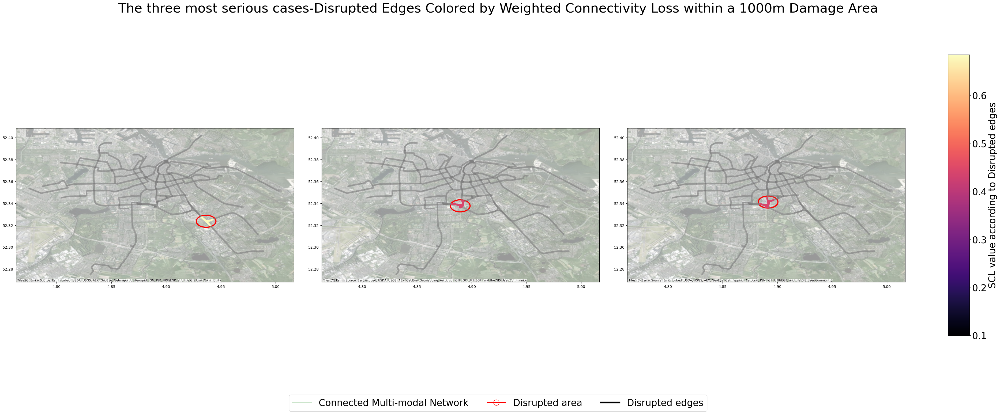

In [158]:
wcl_plt_worst_local_disruption_results(worst_dwcl_each_disruption_1000,city_two_layer_network_edges,dwcl_combined_removed_edges_df_1000,dwcl_combined_buffer_df_1000,dwcl_worst_removed_edges_df_dict_1000,dwcl_worst_buffer_dict_1000,'The three most serious cases-Disrupted Edges Colored by Weighted Connectivity Loss within a 1000m Damage Area')

# Before revise weight in shortest_path function

In [156]:
dwcl_weights_each_disruption_1000,dwcl_distance_each_disruption_1000,dwcl_removed_edges_df_dict_1000,dwcl_buffer_dict_1000,dwcl_combined_removed_edges_df_1000,dwcl_combined_buffer_df_1000 = wcl_local_disruption_function(local_attack_center_points,1000,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,destination_id_df)

In [157]:
worst_dwcl_each_disruption_1000,dwcl_worst_index_list,dwcl_worst_removed_edges_df_dict_1000,dwcl_worst_buffer_dict_1000 = wcl_worst_local_disruption_results(dwcl_weights_each_disruption_1000,dwcl_removed_edges_df_dict_1000,dwcl_buffer_dict_1000,dwcl_combined_removed_edges_df_1000,dwcl_combined_buffer_df_1000)

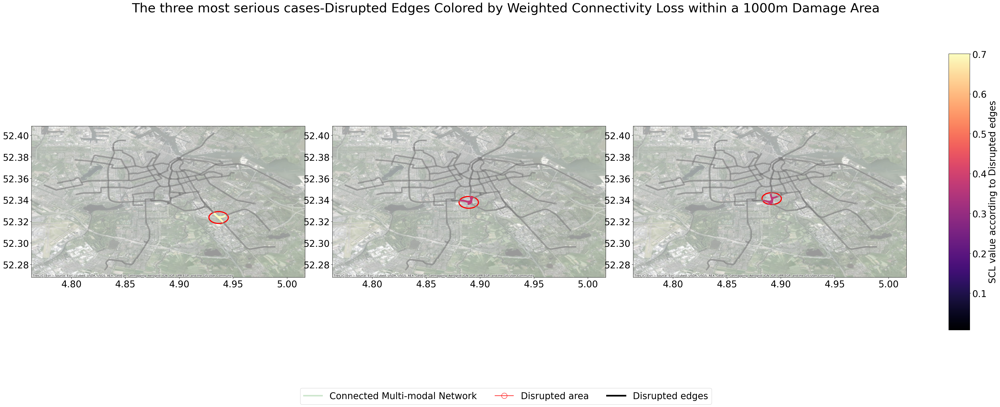

In [165]:
wcl_plt_worst_local_disruption_results(worst_dwcl_each_disruption_1000,city_two_layer_network_edges,dwcl_combined_removed_edges_df_1000,dwcl_combined_buffer_df_1000,dwcl_worst_removed_edges_df_dict_1000,dwcl_worst_buffer_dict_1000,'The three most serious cases-Disrupted Edges Colored by Weighted Connectivity Loss within a 1000m Damage Area')

In [159]:
dwcl_weights_each_disruption_2000,dwcl_distance_each_disruption_2000,dwcl_removed_edges_df_dict_2000,dwcl_buffer_dict_2000,dwcl_combined_removed_edges_df_2000,dwcl_combined_buffer_df_2000 = wcl_local_disruption_function(local_attack_center_points,2000,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,destination_id_df)

In [160]:
worst_dwcl_each_disruption_2000,dwcl_worst_index_list,dwcl_worst_removed_edges_df_dict_2000,dwcl_worst_buffer_dict_2000 = wcl_worst_local_disruption_results(dwcl_weights_each_disruption_2000,dwcl_removed_edges_df_dict_2000,dwcl_buffer_dict_2000,dwcl_combined_removed_edges_df_2000,dwcl_combined_buffer_df_2000)

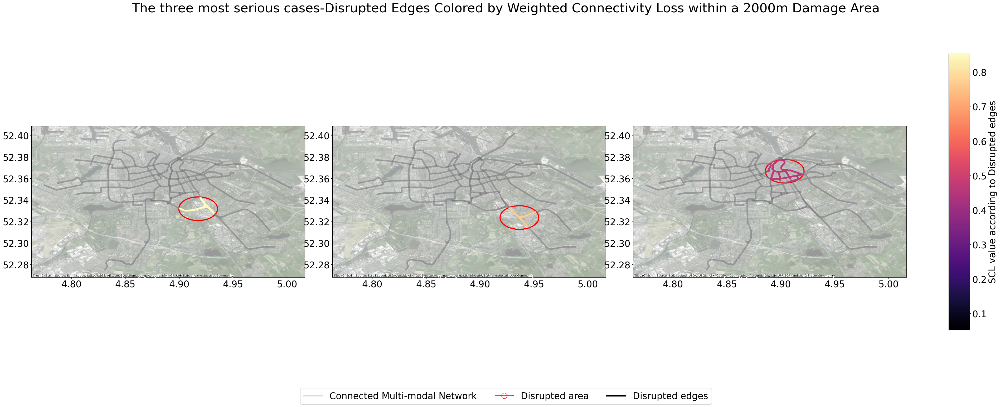

In [161]:
wcl_plt_worst_local_disruption_results(worst_dwcl_each_disruption_2000,city_two_layer_network_edges,dwcl_combined_removed_edges_df_2000,dwcl_combined_buffer_df_2000,dwcl_worst_removed_edges_df_dict_2000,dwcl_worst_buffer_dict_2000,'The three most serious cases-Disrupted Edges Colored by Weighted Connectivity Loss within a 2000m Damage Area')

In [162]:
dwcl_weights_each_disruption_3000,dwcl_distance_each_disruption_3000,dwcl_removed_edges_df_dict_3000,dwcl_buffer_dict_3000,dwcl_combined_removed_edges_df_3000,dwcl_combined_buffer_df_3000 = wcl_local_disruption_function(local_attack_center_points,3000,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,destination_id_df)

In [163]:
worst_dwcl_each_disruption_3000,dwcl_worst_index_list,dwcl_worst_removed_edges_df_dict_3000,dwcl_worst_buffer_dict_3000 = wcl_worst_local_disruption_results(dwcl_weights_each_disruption_3000,dwcl_removed_edges_df_dict_3000,dwcl_buffer_dict_3000,dwcl_combined_removed_edges_df_3000,dwcl_combined_buffer_df_3000)

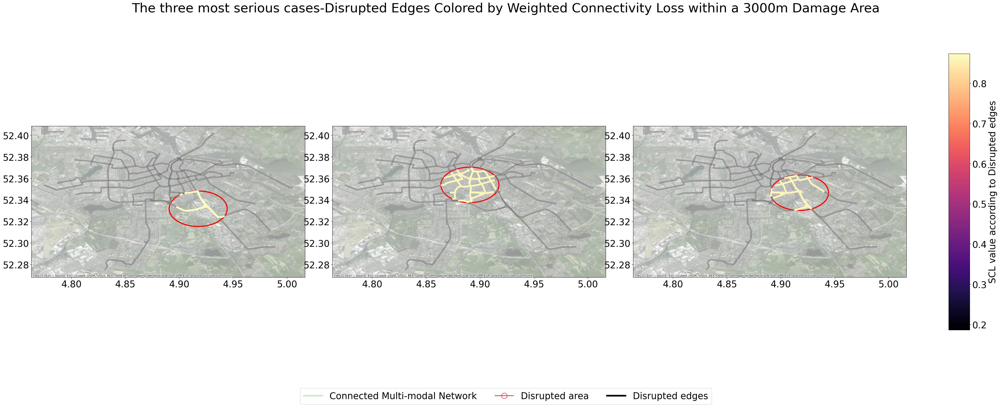

In [164]:
wcl_plt_worst_local_disruption_results(worst_dwcl_each_disruption_3000,city_two_layer_network_edges,dwcl_combined_removed_edges_df_3000,dwcl_combined_buffer_df_3000,dwcl_worst_removed_edges_df_dict_3000,dwcl_worst_buffer_dict_3000,'The three most serious cases-Disrupted Edges Colored by Weighted Connectivity Loss within a 3000m Damage Area')

In [153]:
dwcl_weights_each_disruption_1000

,DWCL_weigths
0,0.235141
1,0.280145
2,0.335971
3,0.205695
4,0.193073
5,0.372727
6,0.126410
7,0.331530
8,0.700447
9,0.007715


In [154]:
dwcl_distance_each_disruption_1000

,DWCL_distance
0,0.225016
1,0.182864
2,0.297340
3,0.181981
4,0.144834
5,0.254116
6,0.127652
7,0.148027
8,0.638155
9,0.081075


## Local disruption in a region_SCL

In [155]:
def parameter_scl(OD_shortest_path_nodes_id):
    sink_id = [lst[-1] for lst in OD_shortest_path_nodes_id.values()]
    OD_sink_id_df = pd.DataFrame({'id': sink_id})
    OD_sink_id_df = OD_sink_id_df.sort_values(by='id').reset_index(drop=True)
    OD_sink_id_df['count'] = OD_sink_id_df.groupby('id')['id'].transform('count')
    OD_sink_id_df = OD_sink_id_df.drop_duplicates(subset=['id']).reset_index(drop=True)
    
    return OD_sink_id_df

In [156]:
def OD_sink_id_scl(OD_shortest_path_nodes_id,OD_dis_shortest_path_nodes_id):
    OD_sink_id_normal = parameter_scl(OD_shortest_path_nodes_id)
    OD_sink_id_disruption = parameter_scl(OD_dis_shortest_path_nodes_id)
    OD_sink_id = pd.merge(OD_sink_id_normal,OD_sink_id_disruption,on='id',how='outer')
    OD_sink_id['count_y'] = OD_sink_id['count_y'].fillna(0)
    OD_sink_id['connectivity_loss'] = OD_sink_id.apply(lambda row: row['count_y'] / row['count_x'], axis=1)
    
    
    return OD_sink_id

In [157]:
# local_dis_stations_name_list = ['Nieuwmarkt']

In [158]:
local_dis_stations_name_list = ['Centraal Station','Amstelstation','Bijlmer ArenA','Holendrecht','Lelylaan','Station RAI','Station Sloterdijk','Zuid','Duivendrecht','De Pijp','Europaplein','Vijzelgracht','Rokin','Overamstel','Wibautstraat','Weesperplein','Waterlooplein','Nieuwmarkt']

In [159]:
city_two_layer_network_stations = pd.concat([city_sub_new_stations,city_tram_new_stations])
city_two_layer_network_stations.reset_index(drop=True,inplace=True)

In [160]:
def local_dis_center_points_list(local_dis_stations_name_list,city_two_layer_network_stations):
    all_local_dis_stations_df = pd.DataFrame()
    for i in range(len(local_dis_stations_name_list)):
        disrupted_region_center_node_df = city_two_layer_network_stations[city_two_layer_network_stations['name'] == local_dis_stations_name_list[i]]
        all_local_dis_stations_df = pd.concat([all_local_dis_stations_df,disrupted_region_center_node_df])
        all_local_dis_stations_df.drop_duplicates(subset='name',inplace=True)
    
    points = [Point(lon, lat) for lon, lat in list(all_local_dis_stations_df.coordinate_value)]
    return points

In [161]:
local_attack_center_points = local_dis_center_points_list(local_dis_stations_name_list,city_two_layer_network_stations)

In [162]:
# local_attack_center_points

In [163]:
def local_attack_region(point,buffer_distance):# 1000-5000
    point_gseries = gpd.GeoSeries([point], crs="EPSG:4326")
    point_gseries = point_gseries.to_crs(epsg=3857)
    buffer = point_gseries.buffer(buffer_distance)
    buffer = buffer.to_crs(epsg=4326)
    buffer_gdf = gpd.GeoDataFrame(geometry=buffer)
    return buffer_gdf

In [164]:
def local_disruption_function(local_attack_center_points,buffer_distance,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,destination_id_df,OD_shortest_path_nodes_id):
    columns = ['simple_connectivity_loss']
    scl_each_disruption_1000 = pd.DataFrame(columns=columns)
    dis_city_two_layer_network_edges_dict_1000 = {}
    OD_dis_shortest_path_edges_dict_1000 = {}
    removed_edges_df_dict_1000 = {}
    buffer_dict_1000 = {}

    for i in range(len(local_attack_center_points)):
        # Get the the two_layer_network_edges after removing one edges under targeted disruption
        buffer_gdf = local_attack_region(local_attack_center_points[i],buffer_distance)
        buffer_dict_1000[i] = buffer_gdf
        city_two_layer_network_edges_gdf = gpd.GeoDataFrame(city_two_layer_network_edges.copy(), crs="EPSG:4326")
        edges_within_buffer = city_two_layer_network_edges_gdf[city_two_layer_network_edges_gdf.within(buffer_gdf.unary_union)]
        removed_edges_id_list = list(edges_within_buffer.geometry)
        removed_edges_df = city_two_layer_network_edges[city_two_layer_network_edges['geometry'].isin(removed_edges_id_list)]
        removed_edges_df_dict_1000[i] = removed_edges_df
        remove_condition = ~city_two_layer_network_edges['geometry'].isin(removed_edges_id_list)
        dis_city_two_layer_network_edges = city_two_layer_network_edges[remove_condition]
        dis_city_two_layer_network_edges_dict_1000[i] = dis_city_two_layer_network_edges

        # Create diGraph
        G2 = nx.DiGraph()
    
        for node_index, row in city_two_layer_network_nodes.iterrows():
            geometry = row['geometry']
            node_id = row['id']
            x, y = geometry.x, geometry.y
            G2.add_node(node_id, pos=(x, y))
    
        edges_for_G2 = dis_city_two_layer_network_edges[['from_id', 'to_id', 'time', 'weights']]
        for edge_index, row in edges_for_G2.iterrows():
            from_id = row['from_id']
            to_id = row['to_id']
            weight = row['weights']
            G2.add_edge(from_id, to_id, weight=weight)
    
        # Calculate shortest path for all OD pairs
        OD_dis_shortest_path_nodes_id = {}
        OD_dis_shortest_path_edges = {}
        OD_dis_length_s_e = {}
        for index, row in OD_id_pairs_df.iterrows():
            try:
                path_s_e, length_s_e, short_path_edges = shortest_path(G2, row.s_id, row.e_id, dis_city_two_layer_network_edges, weight="weights")
                OD_dis_shortest_path_nodes_id[index] = path_s_e
                OD_dis_shortest_path_edges[index] = short_path_edges
                OD_dis_length_s_e[index] = length_s_e
                OD_dis_shortest_path_edges_dict_1000[i] = OD_dis_shortest_path_edges
            except nx.NetworkXNoPath:
                # print(f"No path between {row.s_id} and {row.e_id}. Skipping...")
                continue
    
        # Calculate simple connective loss metrics
        OD_sink_id = OD_sink_id_scl(OD_shortest_path_nodes_id, OD_dis_shortest_path_nodes_id)
        SCL = 1 - sum(OD_sink_id.connectivity_loss) / len(destination_id_df)
        # print(SCL)
    
        # Add the SCL value to the corresponding DataFrame in removed_edges_df_dict_1000 = {}
        removed_edges_df_dict_1000[i]['simple_connectivity_loss'] = SCL
    
        # Create a new DataFrame with the SCL value and append it to scl_each_disruption_1000 using pd.concat
        scl_each_disruption_1000 = pd.concat([scl_each_disruption_1000, pd.DataFrame({'simple_connectivity_loss': [SCL]})], ignore_index=True)
    
    # Extract all DataFrames from the dictionary
    dataframes = list(removed_edges_df_dict_1000.values())
    # Concatenate all DataFrames into a single DataFrame
    combined_removed_edges_df_1000 = pd.concat(dataframes, ignore_index=True)
    combined_removed_edges_df_1000 = combined_removed_edges_df_1000[['osm_id','geometry','railway','id','from_id','to_id','distance','time','weights','route','ref','simple_connectivity_loss']]    
    
    # Concatenate all DataFrames in the dictionary into a single DataFrame
    combined_buffer_df = pd.concat(buffer_dict_1000.values(), ignore_index=True)
   
    return scl_each_disruption_1000,removed_edges_df_dict_1000,buffer_dict_1000,combined_removed_edges_df_1000,combined_buffer_df

In [165]:
scl_each_disruption_1000,removed_edges_df_dict_1000,buffer_dict_1000,combined_removed_edges_df_1000,combined_buffer_df = local_disruption_function(local_attack_center_points,1000,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,destination_id_df,OD_shortest_path_nodes_id)

In [169]:
scl_each_disruption_1000

,simple_connectivity_loss
0,0.166801
1,0.098201
2,0.236075
3,0.145416
4,0.098201
5,0.166801
6,0.098201
7,0.072401
8,0.548427
9,0.049729


In [166]:
def worst_local_disruption_results(scl_each_disruption_1000,removed_edges_df_dict_1000,buffer_dict_1000,combined_removed_edges_df_1000,combined_buffer_df_1000):
    worst_scl_each_disruption_1000 = scl_each_disruption_1000.nlargest(3, 'simple_connectivity_loss')
    worst_index_list = list(worst_scl_each_disruption_1000.index)
    worst_removed_edges_df_dict_1000 = {}
    worst_buffer_dict_1000 = {}
    for index in worst_index_list:
        worst_removed_edges_df_dict_1000[index] = removed_edges_df_dict_1000[index]
        worst_buffer_dict_1000[index] = buffer_dict_1000[index]
    return worst_scl_each_disruption_1000,worst_index_list,worst_removed_edges_df_dict_1000,worst_buffer_dict_1000

In [168]:
worst_scl_each_disruption_1000,worst_index_list,worst_removed_edges_df_dict_1000,worst_buffer_dict_1000 = worst_local_disruption_results(scl_each_disruption_1000,removed_edges_df_dict_1000,buffer_dict_1000,combined_removed_edges_df_1000,combined_buffer_df)

In [170]:
worst_scl_each_disruption_1000

,simple_connectivity_loss
8,0.548427
2,0.236075
0,0.166801


In [ ]:
import os
import matplotlib.pyplot as plt
import geopandas as gpd
from matplotlib.colors import Normalize
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import contextily as ctx
import math

In [ ]:
def plt_local_disruption_results(scl_each_disruption_1000,city_two_layer_network_edges,combined_removed_edges_df_1000,combined_buffer_df_1000,removed_edges_df_dict_1000,buffer_dict_1000,plot_title):
    # Set the number of plots and the layout shape
    num_plots = 18
    fig, axes = plt.subplots(6, 3, figsize=(40, 40))
    plt.rcParams.update({'font.size': 25})
    
    metro_lines = gpd.read_file("./Metro lines.GPKG")
    
    # Initialize the first plot to extract the legend
    city_two_layer_network_edges_gdf = gpd.GeoDataFrame(city_two_layer_network_edges.copy(), geometry='geometry')
    combined_removed_edges_gdf_1000 = gpd.GeoDataFrame(combined_removed_edges_df_1000.copy(), geometry='geometry')
    combined_buffer_gdf_1000 = gpd.GeoDataFrame(combined_buffer_df_1000.copy(), geometry='geometry')
    
    # Define colormap and normalization
    cmap = plt.get_cmap('magma')
    norm = Normalize(vmin=combined_removed_edges_gdf_1000['simple_connectivity_loss'].min(), vmax=combined_removed_edges_gdf_1000['simple_connectivity_loss'].max())
    
    # Create colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # Only needed for the colorbar
    
    # Define custom legend handles
    handles = [
        Line2D([0], [0], color='green', lw=4, alpha=0.2, label='Connected Multi-modal Network'),
        Patch(color='red', alpha=0.6, label='Disrupted area'),
        Line2D([0], [0], color='black', lw=4.5, label='Disrupted edges', linestyle='-')
    ]
    
    # Iterate over the subplots and plot routes for each disruption scenario
    for i, ax in enumerate(axes.flat):
        city_two_layer_network_edges_gdf = gpd.GeoDataFrame(city_two_layer_network_edges.copy(), geometry='geometry')
        combined_removed_edges_gdf_1000 = gpd.GeoDataFrame(removed_edges_df_dict_1000[i].copy(), geometry='geometry')
        combined_buffer_gdf_1000 = gpd.GeoDataFrame(buffer_dict_1000[i].copy(), geometry='geometry')
        
        city_two_layer_network_edges_gdf.plot(ax=ax, color='grey', linewidth=4, alpha=0.4)
        combined_removed_edges_gdf_1000.plot(ax=ax, column='simple_connectivity_loss', linewidth=4.5, legend=False, cmap='magma', norm=norm)
        # combined_buffer_gdf_1000.plot(color='red', alpha=0.6, ax=ax)
        combined_buffer_gdf_1000.plot(edgecolor='red', facecolor='none', linewidth=3, ax=ax)
        ctx.add_basemap(ax=ax, crs=metro_lines.crs.to_string(), source=ctx.providers.Esri.WorldImagery, alpha=0.4)
    
    # Turn off any extra subplots
    for ax in axes.flat[num_plots:]:
        ax.axis('off')
    
    # Add a single legend to the figure
    fig.legend(handles=handles, loc='lower center', fontsize=25, ncol=3)
    
    # Add colorbar as a shared legend for the colormap
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # Position: [left, bottom, width, height]
    cbar = fig.colorbar(sm, cax=cbar_ax)
    cbar.set_label('SCL value according to Disrupted edges', fontsize=25)
    
    # Set a single title for the entire figure
    fig.suptitle(f'{plot_title}', fontsize=35)
    
    # Adjust layout to make space for the legend and title
    fig.subplots_adjust(top=0.95, bottom=0.05, right=0.9)
    
    # Save and show the plot
    plt.savefig(f'{plot_title}', bbox_inches='tight', dpi=600)
    plt.show()    

In [ ]:
def plt_worst_local_disruption_results(scl_each_disruption_1000, city_two_layer_network_edges, combined_removed_edges_df_1000, combined_buffer_df_1000, removed_edges_df_dict_1000, buffer_dict_1000, plot_title):
    # import matplotlib.pyplot as plt
    # import geopandas as gpd
    # from matplotlib.colors import Normalize
    # from matplotlib.lines import Line2D
    # from matplotlib.patches import Patch
    # import contextily as ctx
    
    # Set the number of plots and the layout shape
    num_plots = 3
    fig, axes = plt.subplots(1, num_plots, figsize=(40, 15))
    plt.rcParams.update({'font.size': 25})
    
    metro_lines = gpd.read_file("./Metro lines.GPKG")
    
    # Initialize the first plot to extract the legend
    city_two_layer_network_edges_gdf = gpd.GeoDataFrame(city_two_layer_network_edges.copy(), geometry='geometry')
    combined_removed_edges_gdf_1000 = gpd.GeoDataFrame(combined_removed_edges_df_1000.copy(), geometry='geometry')
    combined_buffer_gdf_1000 = gpd.GeoDataFrame(combined_buffer_df_1000.copy(), geometry='geometry')
    
    # Define colormap and normalization
    cmap = plt.get_cmap('magma')
    norm = Normalize(vmin=combined_removed_edges_gdf_1000['simple_connectivity_loss'].min(), vmax=combined_removed_edges_gdf_1000['simple_connectivity_loss'].max())
    
    # Create colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # Only needed for the colorbar
    
    # Define custom legend handles
    handles = [
        Line2D([0], [0], color='green', lw=4, alpha=0.2, label='Connected Multi-modal Network'),
        # Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=15, label='Disrupted area'),
        Line2D([0], [0], marker='o', color='red', markerfacecolor='none', markersize=15, label='Disrupted area'),
        #Patch(color='red', alpha=0.6, label='Disrupted area'),
        Line2D([0], [0], color='black', lw=4.5, label='Disrupted edges', linestyle='-')
    ]

    # Create a new empty dictionary
    new_removed_edges_df_dict_1000 = {}
    new_buffer_dict_1000 = {}
    
    # Traverse the original dictionary and reassign keys in order
    for new_key, old_key in enumerate(removed_edges_df_dict_1000.keys()):
        new_removed_edges_df_dict_1000[new_key] = removed_edges_df_dict_1000[old_key]
        new_buffer_dict_1000[new_key] = buffer_dict_1000[old_key]
        
    # Iterate over the subplots and plot routes for each disruption scenario
    for i, ax in enumerate(axes.flat):
        city_two_layer_network_edges_gdf = gpd.GeoDataFrame(city_two_layer_network_edges.copy(), geometry='geometry')
        combined_removed_edges_gdf_1000 = gpd.GeoDataFrame(new_removed_edges_df_dict_1000[i].copy(), geometry='geometry')
        combined_buffer_gdf_1000 = gpd.GeoDataFrame(new_buffer_dict_1000[i].copy(), geometry='geometry')
        
        city_two_layer_network_edges_gdf.plot(ax=ax, color='grey', linewidth=4, alpha=0.4)
        combined_removed_edges_gdf_1000.plot(ax=ax, column='simple_connectivity_loss', linewidth=4.5, legend=False, cmap='magma', norm=norm)
        combined_buffer_gdf_1000.plot(edgecolor='red', facecolor='none', linewidth=3, ax=ax)
        ctx.add_basemap(ax=ax, crs=metro_lines.crs.to_string(), source=ctx.providers.Esri.WorldImagery, alpha=0.4)
    
    # Turn off any extra subplots
    for ax in axes.flat[num_plots:]:
        ax.axis('off')
    
    # Add a single legend to the figure
    fig.legend(handles=handles, loc='lower center', fontsize=25, ncol=3, bbox_to_anchor=(0.5, -0.05))
    
    # Add colorbar as a shared legend for the colormap
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # Position: [left, bottom, width, height]
    cbar = fig.colorbar(sm, cax=cbar_ax)
    cbar.set_label('SCL value according to Disrupted edges', fontsize=25)
    
    # Set a single title for the entire figure
    fig.suptitle(f'{plot_title}', fontsize=35)
    
    # Adjust layout to make space for the legend and title
    fig.subplots_adjust(top=0.8, bottom=0.15, right=0.88, left=0.05, wspace=0.1)
    
    # Save and show the plot
    plt.savefig(f'{plot_title}', bbox_inches='tight', dpi=600)
    plt.show()

In [ ]:
scl_each_disruption_1000,removed_edges_df_dict_1000,buffer_dict_1000,combined_removed_edges_df_1000,combined_buffer_df_1000 = local_disruption_function(local_attack_center_points,1000,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,destination_id_df,OD_shortest_path_nodes_id)

In [ ]:
# scl_each_disruption_1000

In [ ]:
# plt_local_disruption_results(scl_each_disruption_1000,city_two_layer_network_edges,combined_removed_edges_df_1000,combined_buffer_df_1000,removed_edges_df_dict_1000,buffer_dict_1000,'Disrupted Edges Colored by Simple Connectivity Loss within a 1000m Damage Area')

In [ ]:
worst_scl_each_disruption_1000,worst_index_list,worst_removed_edges_df_dict_1000,worst_buffer_dict_1000 = worst_local_disruption_results(scl_each_disruption_1000,removed_edges_df_dict_1000,buffer_dict_1000,combined_removed_edges_df_1000,combined_buffer_df_1000)

In [ ]:
worst_scl_each_disruption_1000

In [ ]:
plt_worst_local_disruption_results(worst_scl_each_disruption_1000,city_two_layer_network_edges,combined_removed_edges_df_1000,combined_buffer_df_1000,worst_removed_edges_df_dict_1000,worst_buffer_dict_1000,'The three most serious cases-Disrupted Edges Colored by Simple Connectivity Loss within a 1000m Damage Area')

In [ ]:
scl_each_disruption_2000,removed_edges_df_dict_2000,buffer_dict_2000,combined_removed_edges_df_2000,combined_buffer_df_2000 = local_disruption_function(local_attack_center_points,2000,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,destination_id_df)

In [ ]:
# scl_each_disruption_2000

In [ ]:
# removed_edges_df_dict_2000

In [ ]:
# scl_each_disruption_2000

In [ ]:
# plt_local_disruption_results(2000,city_two_layer_network_edges,combined_removed_edges_df_2000,combined_buffer_df_2000,removed_edges_df_dict_2000,buffer_dict_2000)

In [ ]:
worst_scl_each_disruption_2000,worst_index_list_2000,worst_removed_edges_df_dict_2000,worst_buffer_dict_2000 = worst_local_disruption_results(scl_each_disruption_2000,removed_edges_df_dict_2000,buffer_dict_2000,combined_removed_edges_df_2000,combined_buffer_df_2000)

In [ ]:
plt_worst_local_disruption_results(worst_scl_each_disruption_2000,city_two_layer_network_edges,combined_removed_edges_df_2000,combined_buffer_df_2000,worst_removed_edges_df_dict_2000,worst_buffer_dict_2000,'The three most serious cases-Disrupted Edges Colored by Simple Connectivity Loss within a 2000m Damage Area')

In [ ]:
scl_each_disruption_3000,removed_edges_df_dict_3000,buffer_dict_3000,combined_removed_edges_df_3000,combined_buffer_df_3000 = local_disruption_function(local_attack_center_points,3000,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,destination_id_df)

In [ ]:
# scl_each_disruption_3000

In [ ]:
# plt_local_disruption_results(city_two_layer_network_edges,combined_removed_edges_df_3000,combined_buffer_df_3000,removed_edges_df_dict_3000,buffer_dict_3000)

In [ ]:
worst_scl_each_disruption_3000,worst_index_list_3000,worst_removed_edges_df_dict_3000,worst_buffer_dict_3000 = worst_local_disruption_results(scl_each_disruption_3000,removed_edges_df_dict_3000,buffer_dict_3000,combined_removed_edges_df_3000,combined_buffer_df_3000)

In [ ]:
plt_worst_local_disruption_results(worst_scl_each_disruption_3000,city_two_layer_network_edges,combined_removed_edges_df_3000,combined_buffer_df_3000,worst_removed_edges_df_dict_3000,worst_buffer_dict_3000,'The three most serious cases-Disrupted Edges Colored by Simple Connectivity Loss within a 3000m Damage Area')

In [ ]:
scl_each_disruption_4000,removed_edges_df_dict_4000,buffer_dict_4000,combined_removed_edges_df_4000,combined_buffer_df_4000 = local_disruption_function(local_attack_center_points,4000,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,destination_id_df)

In [ ]:
# scl_each_disruption_4000

In [ ]:
# plt_local_disruption_results(city_two_layer_network_edges,combined_removed_edges_df_4000,combined_buffer_df_4000,removed_edges_df_dict_4000,buffer_dict_4000)

In [ ]:
worst_scl_each_disruption_4000,worst_index_list_4000,worst_removed_edges_df_dict_4000,worst_buffer_dict_4000 = worst_local_disruption_results(scl_each_disruption_4000,removed_edges_df_dict_4000,buffer_dict_4000,combined_removed_edges_df_4000,combined_buffer_df_4000)

In [ ]:
plt_worst_local_disruption_results(worst_scl_each_disruption_4000,city_two_layer_network_edges,combined_removed_edges_df_4000,combined_buffer_df_4000,worst_removed_edges_df_dict_4000,worst_buffer_dict_4000,'The three most serious cases-Disrupted Edges Colored by Simple Connectivity Loss within a 4000m Damage Area')

In [ ]:
scl_each_disruption_5000,removed_edges_df_dict_5000,buffer_dict_5000,combined_removed_edges_df_5000,combined_buffer_df_5000 = local_disruption_function(local_attack_center_points,5000,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,destination_id_df)

In [ ]:
# scl_each_disruption_5000

In [ ]:
# plt_local_disruption_results(city_two_layer_network_edges,combined_removed_edges_df_5000,combined_buffer_df_5000,removed_edges_df_dict_5000,buffer_dict_5000)

In [ ]:
worst_scl_each_disruption_5000,worst_index_list_5000,worst_removed_edges_df_dict_5000,worst_buffer_dict_5000 = worst_local_disruption_results(scl_each_disruption_5000,removed_edges_df_dict_5000,buffer_dict_5000,combined_removed_edges_df_5000,combined_buffer_df_5000)

In [ ]:
plt_worst_local_disruption_results(worst_scl_each_disruption_5000,city_two_layer_network_edges,combined_removed_edges_df_5000,combined_buffer_df_5000,worst_removed_edges_df_dict_5000,worst_buffer_dict_5000,'The three most serious cases-Disrupted Edges Colored by Simple Connectivity Loss within a 5000m Damage Area')